In [2]:
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', 50000)
pd.set_option('display.max_rows', 1000000)
pd.set_option('display.max_colwidth',None)
pd.set_option('display.float_format',lambda x: '%.4f' % x)
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as pl
import plotly.express as px
import plotly.graph_objects as go
from matplotlib.pyplot import figure
import matplotlib.pylab as pll
from collections import Counter
from datetime import datetime
import time
import random
import math
import os
from sklearn import metrics
import sklearn
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
import hdbscan
import kaleido
from sklearn.metrics import silhouette_score
import colorcet as cc
import matplotlib.pyplot as plt
import seaborn as sns
from pylab import rcParams
from sklearn.model_selection import RandomizedSearchCV
import hdbscan
from sklearn.metrics import make_scorer
import logging 
from sklearn.cluster import OPTICS, cluster_optics_dbscan
from scipy.spatial import ConvexHull, convex_hull_plot_2d
logging.captureWarnings(True)

In [3]:
slurm1 = pd.read_csv('SlurmPlot2.csv')
slurm1.tail(100)

,Unnamed: 0,UID,Account,JobID,AllocCPUS,AllocNodes,AssocID,AveCPU,AveCPUFreq,AveDiskRead,AveDiskWrite,AvePages,AveRSS,AveVMSize,Cluster,ConsumedEnergyRaw,CPUTime,CPUTimeRAW,DBIndex,Elapsed,ElapsedRaw,Eligible,End,ExitCode,JobIDRaw,Layout,MaxDiskRead,MaxDiskReadNode,MaxDiskReadTask,MaxDiskWrite,MaxDiskWriteNode,MaxDiskWriteTask,MaxPages,MaxPagesNode,MaxPagesTask,MaxRSS,MaxRSSNode,MaxRSSTask,MaxVMSize,MaxVMSizeNode,MaxVMSizeTask,NCPUS,NNodes,NodeList,NTasks,Priority,Partition,QOS,QOSRAW,ReqCPUFreq,ReqCPUFreqMin,ReqCPUFreqMax,ReqCPUFreqGov,ReqCPUS,ReqMem,ReqNodes,Reservation,ReservationId,Reserved,ResvCPU,ResvCPURAW,Start,State,Submit,SystemCPU,Timelimit,TimelimitRaw,TotalCPU,UserCPU,TRESAllocEnergy,TRESBilling,TRESAllocMem,TRESAllocCPU,TRESINAveUsageCpu,TRESINAveUsageFsordisk,TRESINAveUsagemem,TRESINAveUsagevmem,TRESINAveUsagepages,TRESINMaxUsageFsordisk,TRESINMaxUsagemem,TRESINMaxUsagevmem,TRESINMaxUsagepages,TRESINMaxNodeUsageFsordisk,TRESINMaxNodeUsagemem,TRESINMaxNodeUsagevmem,TRESINMaxNodeUsagepages,TRESINMaxTaskUsageFsordisk,TRESINMaxTaskUsagemem,TRESINMaxTaskUsagevmem,TRESINMaxTaskUsagepages,TRESOutAveUsageCpu,TRESOutAveUsageFsordisk,TRESOutAveUsagemem,TRESOutAveUsagevmem,TRESOutAveUsagepages,TRESOutMaxUsageFsordisk,TRESOutMaxUsagemem,TRESOutMaxUsagevmem,TRESOutMaxUsagepages,TRESOutMaxNodeUsageFsordisk,TRESOutMaxNodeUsagemem,TRESOutMaxNodeUsagevmem,TRESOutMaxNodeUsagepages,TRESOutMaxTaskUsageFsordisk,TRESOutMaxTaskUsagemem,TRESOutMaxTaskUsagevmem,TRESOutMaxTaskUsagepages,AveCPUtime,Reservedtime,TotalCPUtime,UserCPUtime,SystemCPUtime,Endtimestamp,Starttimestamp,Eligibletimestamp,Submittimestamp,Nodelistcn,Nodelistfpga,NodeLists
4215015,4215015,213.0000,77,1062949.extern,40,1,2174,00:00:00,3.1000,0.0000,0.0000,0.0000,0.8160,142.9440,noctua,6870.0000,00:16:00,960,6853569,00:00:24,24,2022-01-20 18:27:02,2022-01-20 18:27:26,0:0,1062949.extern,Unknown,0.0000,cn-0252,0.0000,0.0000,cn-0252,0.0000,0.0000,cn-0252,0.0000,0.8160,cn-0252,0.0000,142.9440,cn-0252,0.0000,40,1,cn-0252,1.0000,NaN,NaN,NaN,NaN,0,0,0,0,40,NaN,1,NaN,NaN,NaN,NaN,NaN,2022-01-20 18:27:02,COMPLETED,2022-01-20 18:27:02,00:00:00,NaN,NaN,00:00:00,00:00:00,NaN,40.0000,182000.0000,40.0000,00:00:00,844.0000,0.8160,142.9440,0.0000,844.0000,0.8160,142.9440,0.0000,cn-0252,cn-0252,cn-0252,cn-0252,0.0000,0.0000,0.0000,0.0000,NaN,NaN,NaN,NaN,NaN,844.0000,0.8160,142.9440,0.0000,cn-0252,cn-0252,cn-0252,cn-0252,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1642699646.0,1642699622.0,1642699622.0000,1642699622.0000,0,0,0
4215016,4215016,170.0000,81,1062950,40,1,464,NaN,NaN,NaN,NaN,NaN,NaN,NaN,noctua,25.0000,03:36:00,12960,6853570,00:05:24,324,2022-01-20 18:27:12,2022-01-20 18:33:40,0:0,1062950,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40,1,fpga-0010,NaN,350027.0000,fpga,cont,10.0000,Unknown,Unknown,Unknown,Unknown,1,182000.0000,1,NaN,NaN,00:01:04,00:01:04,64.0000,2022-01-20 18:28:16,COMPLETED,2022-01-20 18:27:12,00:00.015,00:10:00,10.0000,00:00.028,00:00.013,25.0000,40.0000,182000.0000,40.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0000,0.0280,0.0130,0.0150,1642700020.0,1642699696.0,1642699632.0000,1642699632.0000,0,0,0
4215017,4215017,170.0000,81,1062950.batch,40,1,464,00:00:00,1.8100,0.0000,0.0000,0.0000,1.2520,141.3240,noctua,11.0000,03:36:00,12960,6853570,00:05:24,324,2022-01-20 18:28:16,2022-01-20 18:33:40,0:0,1062950.batch,Unknown,0.0000,fpga-0010,0.0000,0.0000,fpga-0010,0.0000,0.0000,fpga-0010,0.0000,1.2520,fpga-0010,0.0000,141.3240,fpga-0010,0.0000,40,1,fpga-0010,1.0000,NaN,NaN,NaN,NaN,0,0,0,0,40,NaN,1,NaN,NaN,NaN,NaN,NaN,2022-01-20 18:28:16,COMPLETED,2022-01-20 18:28:16,00:00.015,NaN,NaN,00:00.028,00:00.012,NaN,NaN,182000.0000,40.0000,00:00:00,0.0000,1.2520,141.3240,0.0000,0.0000,1.2520,141.3240,0.0000,fpga-0010,fpga-0010,fpga-0010,fpga-0010,0.0000,0.0000,0.0000,0.0000,NaN,NaN,NaN,NaN,NaN,0.0000,1.2520,141.3240,0.0000,fpga-0010,fpga

In [4]:
slurm1['year'] = pd.DatetimeIndex(slurm1['Submit']).year
slurm1['month'] = pd.DatetimeIndex(slurm1['Submit']).month
slurm1['year'] = slurm1['year'].apply(str)
slurm1['month'] = slurm1['month'].apply(str)
slurm1['JobID'] = slurm1['JobID'].astype(str)
slurm1['yearmonth'] = slurm1['year'] + '-' + slurm1['month']
slurm1 = slurm1[slurm1["Starttimestamp"] != 'Unknown']
slurm1 = slurm1[slurm1["Endtimestamp"] != 'Unknown']
slurm1['JobLen'] = slurm1['Endtimestamp'].astype(float) - slurm1['Starttimestamp'].astype(float)
slurm1['Totalres'] = slurm1['JobLen'] * slurm1['NNodes']
discard = ["."]
slurm = slurm1[~slurm1.JobID.str.contains('|'.join(discard),regex = False)]

In [5]:
slurm2 = slurm1.copy()

In [6]:
slurm2['JobID'] = slurm2['JobID'].apply(str)
def case1(value):
    if '.' in value:
        return value.split('.')[0]
    else:
        return value
slurm2['JobID'] = slurm2['JobID'].map(lambda x: case1(x))

In [7]:
slurm2['JobID'] = slurm2['JobID'].infer_objects()
slurm3 = slurm2.groupby('JobID', as_index=False).agg({'MaxRSS':'max'})
slurm3.shape

(886498, 2)

In [8]:
slurm3.head()

,JobID,MaxRSS
0,1000000,1.2960
1,1000001,1.2960
2,1000002,1.2960
3,1000003,1.2960
4,1000004,1.2960


In [16]:
slurmneg = slurm[slurm.JobLen >= 0]

In [17]:
slurmneg = slurmneg.drop(['MaxRSS'], axis=1)

In [18]:
slurmneg = pd.merge(slurmneg, slurm3, on=['JobID'])

# Multi - dimesional clustering

In [ ]:
df_list = []
def function1(years):
    for i in years:
        temp = slurmneg[slurmneg.yearmonth.str.contains(i,regex = False)]
        df_list.append(temp)

In [ ]:
years = ['2019','2020','2021','2022']
function1(years)

In [ ]:
for c in years:
    exec('year_{} = pd.DataFrame()'.format(c))
year_2019 = df_list[0]
year_2020 = df_list[1]
year_2021 = df_list[2]
year_2022 = df_list[3]
Year_2019 = year_2019.sample(frac = 0.10)
Year_2020 = year_2020.sample(frac = 0.15)
Year_2021 = year_2021.sample(frac = 0.15)
Year_2022 = year_2022.sample(frac = 0.01)    

In [ ]:
sample = pd.concat([Year_2019, Year_2020,Year_2021,Year_2022])
cluster = sample.sample(n = 50000)

In [ ]:
cluster.describe()

In [19]:
slurmnegg = slurmneg[['NNodes','MaxRSS','Partition','TotalCPUtime','JobLen','TimelimitRaw']]

In [ ]:
clusternew = cluster[['NNodes','MaxRSS','TotalCPUtime','JobLen']]

In [ ]:
clusternew['eachnodecpu'] = clusternew['TotalCPUtime'] / clusternew['NNodes']


In [ ]:
clusternew1 = clusternew.copy()

In [ ]:
clusternew1['NNodes'] = np.power(clusternew1['NNodes'],(1/3))
clusternew1['MaxRSS'] = np.power(clusternew1['MaxRSS'],(1/3))
clusternew1['eachnodecpu'] = np.power(clusternew1['eachnodecpu'],(1/3))
clusternew1['JobLen'] = np.power(clusternew1['JobLen'],(1/3))

In [ ]:
clusternew1 = clusternew1.drop(['TotalCPUtime'], axis=1)
clusternew1['MaxRSS'] = clusternew1['MaxRSS'].fillna(0)

In [ ]:
clusternew1 = clusternew1.dropna(axis=0, subset=['eachnodecpu'])

In [ ]:
sc_x = StandardScaler()
clusternew2 = sc_x.fit_transform(clusternew1)

In [ ]:
clusternew1[clusternew1.isna().any(axis=1)]

In [ ]:
temp = 0
best = 0
from sklearn.metrics import silhouette_score
silhouette_avg = []
K = range(5,80)
for num_clusters in K:
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(clusternew2)
    cluster_labels = kmeans.labels_
    temp = silhouette_score(clusternew2, cluster_labels)
    silhouette_avg.append(temp)
    max_value = max(silhouette_avg)
    best = silhouette_avg.index(max_value)
    print(silhouette_avg)
    print(best)

In [ ]:
km3 = KMeans(n_clusters= best + 5)
km3.fit(clusternew1)
clusternew['Clustered'] = pd.Series(km3.labels_, index=clusternew1.index)
clusternew['Clustered'].value_counts()


In [ ]:
clusternew['MaxRSS'] = clusternew['MaxRSS'].fillna(0)
clusternew = clusternew.drop(['TotalCPUtime'], axis=1)

In [ ]:
clusternew.head()

In [ ]:
clusternew = clusternew.dropna(axis=0, subset=['Clustered'])
clusternew['Clustered'] = clusternew['Clustered'].astype(int)

In [ ]:
count = 0
# clusternew = clusternew.drop(['DBcluster'], axis=1)
for colu in clusternew:
    if colu != 'Clustered':
        x = colu
        xval = clusternew[colu]
        cluster = clusternew['Clustered']
        for col in clusternew:
            if col != 'Clustered' and col != colu:
                y = col
                yval = clusternew[col]
                dicts = {'Clustered' : cluster,'{}'.format(colu) : xval,'{}_minimum'.format(colu) : xval, '{}_maximum'.format(colu) : xval , '{}'.format(col) : yval, '{}_minimum'.format(col) : yval, '{}_maximum'.format(col) : yval, '{}_mean'.format(col) : yval} 
                df = pd.DataFrame(dicts)
                df['Jobs'] = 1
                df2 = df.groupby('Clustered', as_index=False).agg({'{}'.format(colu):'mean','{}'.format(col):'mean','{}_minimum'.format(colu):'min','{}_maximum'.format(colu) : 'max','{}_minimum'.format(col):'min','{}_maximum'.format(col):'max','Jobs': 'sum'})
                df2 = df2.round(decimals=2)
                plt.figure(figsize=(15, 5))
                sns.scatterplot(x=x, y=y,hue = clusternew['Clustered'], data=clusternew,palette="bright")
                the_table = plt.table(cellText=df2.values,
                rowLabels=df2.index,
                colLabels=df2.columns,
                cellLoc = 'center', rowLoc = 'center',
                bbox = ([0.25, -3, 1, 2]),loc='bottom')
                the_table.auto_set_font_size(False)
                the_table.set_fontsize(10)
                count = count + 1
                if not os.path.exists('km3_multi'):
                    os.makedirs('km3_multi')
                plt.savefig('km3_multi/{}.png'.format(str(count)),bbox_inches='tight', dpi=100)
                plt.show()

In [ ]:
DBS = hdbscan.HDBSCAN(min_samples =3,cluster_selection_epsilon =0.09,min_cluster_size = 30)
DBS.fit_predict(clusternew2)

clusternew['DBcluster'] = pd.Series(DBS.labels_, index=clusternew1.index)
clusternew['DBcluster'].value_counts()

In [ ]:
a = clusternew['DBcluster'].value_counts()


In [ ]:
clusternew = clusternew.round(decimals=2)

In [ ]:
clusternew['MaxRSS'] = clusternew['MaxRSS'].fillna(0)

In [ ]:
clusternew.describe()

In [ ]:
clusternew = clusternew.dropna(axis=0, subset=['DBcluster'])
clusternew['DBcluster'] = clusternew['DBcluster'].astype(int)

In [ ]:
count = 0
clusternew = clusternew.drop(['Clustered'], axis=1)
for colu in clusternew:
    if colu != 'DBcluster':
        x = colu
        xval = clusternew[colu]
        cluster = clusternew['DBcluster']
        for col in clusternew:
            if col != 'DBcluster' and col != colu:
                y = col
                yval = clusternew[col]
                dicts = {'DBcluster' : cluster,'{}'.format(colu) : xval,'{}_minimum'.format(colu) : xval, '{}_maximum'.format(colu) : xval , '{}'.format(col) : yval, '{}_minimum'.format(col) : yval, '{}_maximum'.format(col) : yval, '{}_mean'.format(col) : yval} 
                df = pd.DataFrame(dicts)
                df2 = df.groupby('DBcluster', as_index=False).agg({'{}'.format(colu):'mean','{}'.format(col):'mean','{}_minimum'.format(colu):'min','{}_maximum'.format(colu) : 'max','{}_minimum'.format(col):'min','{}_maximum'.format(col):'max'})
                df2 = df2.round(decimals=2)
                plt.figure(figsize=(15, 5))
                palette = sns.color_palette(cc.glasbey, n_colors=len(a))
                sns.scatterplot(x=x, y=y,hue = clusternew['DBcluster'], data=clusternew,palette=palette)
                the_table = plt.table(cellText=df2.values,
                rowLabels=df2.index,
                colLabels=df2.columns,
                cellLoc = 'center', rowLoc = 'center',
                bbox = ([0, -6, 1, 5]),loc='bottom')
                the_table.auto_set_font_size(False)
                the_table.set_fontsize(10)
                count = count + 1
                if not os.path.exists('DB_multi'):
                    os.makedirs('DB_multi')
                plt.savefig('DB_multi/{}.png'.format(str(count)),bbox_inches='tight', dpi=100)
                plt.show()

In [ ]:
count = 0
for colu in clusternew:
    if colu != 'DBcluster':
        x = colu
        xval = clusternew[colu]
        cluster = clusternew['DBcluster']
        for col in clusternew:
            if col != 'DBcluster' and col != colu:
                y = col
                yval = clusternew[col]
                dicts = {'DBcluster' : cluster,'{}'.format(colu) : xval,'{}_minimum'.format(colu) : xval, '{}_maximum'.format(colu) : xval , '{}'.format(col) : yval, '{}_minimum'.format(col) : yval, '{}_maximum'.format(col) : yval, '{}_mean'.format(col) : yval} 
                df = pd.DataFrame(dicts)
                df['Jobs'] = 1
                df2 = df.groupby('DBcluster', as_index=False).agg({'{}'.format(colu):'mean','{}'.format(col):'mean','{}_minimum'.format(colu):'min','{}_maximum'.format(colu) : 'max','{}_minimum'.format(col):'min','{}_maximum'.format(col):'max','Jobs':'sum'})
                df2 = df2.round(decimals=2)
                plt.figure(figsize=(15, 5))
                Clustered = clusternew['DBcluster'].unique()
                Clustered = Clustered.tolist()
                for i in Clustered:
                    import matplotlib.colors as pltc
                    from random import sample
                    all_colors = [k for k,v in pltc.cnames.items()]
                    aa = clusternew[(clusternew['DBcluster'] == i)]
                    cpy = aa.copy()
                    aa = list(zip(aa[x],aa[y]))
                    aa = [list(elem) for elem in aa]
                    res1, res2 = map(list, zip(*aa))
                    res = all(ele == res1[0] for ele in res1)
                    ress = all(ele == res2[0] for ele in res2)
                    result = all(element == aa[0] for element in aa)
                    aa = np.array(aa)
                    plt.plot(aa[:,0], aa[:,1], '*',markersize=5)
                    plt.xlabel('')
                    plt.ylabel(y)
                    if not result | ress | res:
                        hull = ConvexHull(aa,qhull_options='QJ')
                        colors = sample(all_colors, len(Clustered))
                        for simplex,c in zip(hull.simplices,colors):
                            fig = plt.plot(aa[simplex, 0], aa[simplex, 1], 'k-')
                            plt.title('Clustering'.format(i))   
                    if res | ress:   
                        plt.plot(cpy[x], cpy[y])    
                the_table = plt.table(cellText=df2.values,
                rowLabels=df2.index,
                colLabels=df2.columns,
                cellLoc = 'center', rowLoc = 'center',
                bbox = ([0, -6, 1, 5]),loc='bottom')
                the_table.auto_set_font_size(False)
                the_table.set_fontsize(10)
                count = count + 1
                if not os.path.exists('convex_hull_DB_multi'):
                    os.makedirs('convex_hull_DB_multi')
                plt.savefig('convex_hull_DB_multi/{}.png'.format(str(count)),bbox_inches='tight', dpi=100)
                plt.show()

In [ ]:
count = 0
for colu in clusternew:
    if colu != 'DBcluster':
        x = colu
        xval = clusternew[colu]
        cluster = clusternew['DBcluster']
        for col in clusternew:
            if col != 'DBcluster' and col != colu:
                y = col
                yval = clusternew[col]
                dicts = {'DBcluster' : cluster,'{}'.format(colu) : xval,'{}_minimum'.format(colu) : xval, '{}_maximum'.format(colu) : xval , '{}'.format(col) : yval, '{}_minimum'.format(col) : yval, '{}_maximum'.format(col) : yval, '{}_mean'.format(col) : yval} 
                df = pd.DataFrame(dicts)
                df['Jobs'] = 1
                df2 = df.groupby('DBcluster', as_index=False).agg({'{}'.format(colu):'mean','{}'.format(col):'mean','{}_minimum'.format(colu):'min','{}_maximum'.format(colu) : 'max','{}_minimum'.format(col):'min','{}_maximum'.format(col):'max','Jobs':'sum'})
                df2 = df2.round(decimals=2)
                plt.figure(figsize=(15, 5))
                Clustered = clusternew['DBcluster'].unique()
                Clustered = Clustered.tolist()
                for i in Clustered:
                    aa = clusternew[(clusternew['DBcluster'] == i)]
                    cpy = aa.copy()
                    aa = list(zip(aa[x],aa[y]))
                    aa = [list(elem) for elem in aa]
                    res1, res2 = map(list, zip(*aa))
                    res = all(ele == res1[0] for ele in res1)
                    ress = all(ele == res2[0] for ele in res2)
                    result = all(element == aa[0] for element in aa)
                    if result:
                        aa = np.array(aa)
                        plt.plot(aa[:,0], aa[:,1], '*',markersize=5)
                    plt.xlabel(x)
                    plt.ylabel(y)
                    if not result | ress | res:
                        aa = np.array(aa)
                        hull = ConvexHull(aa,qhull_options='QJ')
                        for simplex in hull.simplices:
                            plt.plot(aa[simplex, 0], aa[simplex, 1], 'k-',markersize=1)
                    if res | ress:   
                        plt.plot(cpy[x], cpy[y],'-',markersize=1)    
                the_table = plt.table(cellText=df2.values,
                rowLabels=df2.index,
                colLabels=df2.columns,
                cellLoc = 'center', rowLoc = 'center',
                bbox = ([0, -6, 1, 5]),loc='bottom')
                the_table.auto_set_font_size(False)
                the_table.set_fontsize(10)
                count = count + 1
                if not os.path.exists('convex_hull2_DB_multi'):
                    os.makedirs('convex_hull2_DB_multi')
                plt.savefig('convex_hull2_DB_multi/{}.png'.format(str(count)),bbox_inches='tight', dpi=100)
                plt.show()

# 2d - clustering

## According to Partition

In [20]:
slurmnegg['Account'] = slurmneg[['Account']]

In [21]:
p = slurmnegg[['Partition','NNodes','TimelimitRaw']]

In [22]:
pj = slurmnegg[['Partition','NNodes','JobLen']]

## K-Means for time limit and number of nodes

In [ ]:
def functiontestsil(partitions):
    coun = 0
    sil = 0
    best = 0
    best2 = 0
    
    NNodesspread = 0
    TLspread = 0
    for i in partitions:
        best = 0
        best2 = 0
        print(i)
        temp = p.loc[p.Partition == i] 
        if len(temp.index) >= 20:
            ClusterData = temp.drop(['Partition'], axis=1)
            print(ClusterData.shape)
            sc_x = StandardScaler()
            ClusterData = sc_x.fit_transform(ClusterData)
            silhouette_avg = []
            K = range(2,30)
            for num_clusters in K:
                countbest = 0
                countbest2 = 0
                kmeans = KMeans(n_clusters=num_clusters)
                kmeans.fit(ClusterData)
                cluster_labels = kmeans.labels_
                sil = silhouette_score(ClusterData, cluster_labels)
                temp['Clustered'] = pd.Series(kmeans.labels_, index=temp.index)
                temp['min_NNodes'] = temp[['NNodes']]
                temp['max_NNodes'] = temp[['NNodes']]
                temp['min_timelimit'] = temp[['TimelimitRaw']]
                temp['max_timelimit'] = temp[['TimelimitRaw']]
               
                temp2 = temp.groupby('Clustered', as_index=False).agg({'NNodes':'mean','TimelimitRaw':'mean','min_NNodes':'min','max_NNodes':'max','min_timelimit':'min','max_timelimit':'max'})
                print("K ",num_clusters)
                leng = temp2['Clustered']
                silhouette_avg.append(sil)
                for index, row in temp2.iterrows():
                    NNodesspread = row['max_NNodes'] - row['min_NNodes']
                    TLspread = row['max_timelimit'] - row['min_timelimit']
                    print('N ',NNodesspread)
                    print('TL ',TLspread)
                    if NNodesspread > 10 or TLspread > 100:
                        res = all(sil >= i for i in silhouette_avg)
                        print(res)
                        print(sil)
                        print(silhouette_avg)
                        if res == True:
                            countbest2 = countbest2 + 1
                    else:
                        if len(leng) > 100:
                            countbest = countbest + 1
                
                print('cb2',countbest2)
                print('cb',countbest)
                if countbest2 >= countbest:
                    best2 = num_clusters
                elif countbest > countbest2:
                    best = num_clusters     
                print('if only largespread ',best2)
                print('small spread ',best)
            if best != 0:           
                kmeans = KMeans(n_clusters=best)
            else:
                kmeans = KMeans(n_clusters=best2)
            kmeans.fit(ClusterData)
            temp['Clustered'] = pd.Series(kmeans.labels_, index=temp.index)
            temp['min_NNodes'] = temp[['NNodes']]
            temp['max_NNodes'] = temp[['NNodes']]
            temp['min_timelimit'] = temp[['TimelimitRaw']]
            temp['max_timelimit'] = temp[['TimelimitRaw']]
            temp2 = temp.groupby('Clustered', as_index=False).agg({'NNodes':'mean','TimelimitRaw':'mean','min_NNodes':'min','max_NNodes':'max','min_timelimit':'min','max_timelimit':'max'})
            rcParams['figure.figsize'] = 60, 10
            if best != 0: 
                palette = sns.color_palette(cc.glasbey, n_colors=best)
            else:
                palette = sns.color_palette(cc.glasbey, n_colors=best2)
            sns.scatterplot(x='NNodes', y='TimelimitRaw', hue='Clustered',data=temp,palette=palette).set(title='Clustering for the account {}'.format(i))
            the_table = plt.table(cellText=temp2.values,
            rowLabels=temp2.index,
            colLabels=temp2.columns,
            cellLoc = 'center', rowLoc = 'center',
            bbox = ([0, -4, 0.8, 3]),loc='bottom')
            the_table.auto_set_font_size(False)
            the_table.set_fontsize(10)
            if not os.path.exists('functiontestsil'):
                os.makedirs('functiontestsil')
            plt.savefig('functiontestsil/{}_Partition_clustering_1.png' .format(i),bbox_inches='tight', dpi=100)
            plt.show()    

In [ ]:
partitions = slurmneg['Partition'].unique()
partitions = partitions.tolist()
functiontestsil(partitions)

In [ ]:
def function(partitions):
    coun = 0
    sil = 0
    best = 0
    for i in partitions:
        print(i)
        temp = p.loc[p.Partition == i] 
        if len(temp.index) >= 20:
            ClusterData = temp.drop(['Partition'], axis=1)
            print(ClusterData.shape)
            sc_x = StandardScaler()
            ClusterData = sc_x.fit_transform(ClusterData)
            silhouette_avg = []
            K = range(2,50)
            for num_clusters in K:
                kmeans = KMeans(n_clusters=num_clusters)
                kmeans.fit(ClusterData)
                cluster_labels = kmeans.labels_
                sil = silhouette_score(ClusterData, cluster_labels)
                silhouette_avg.append(sil)
                max_value = max(silhouette_avg)
                print(max_value)
                best = silhouette_avg.index(max_value) + 2
            
            kmeans = KMeans(n_clusters=best)
            kmeans.fit(ClusterData)
            temp['Clustered'] = pd.Series(kmeans.labels_, index=temp.index)
            temp['min_NNodes'] = temp[['NNodes']]
            temp['max_NNodes'] = temp[['NNodes']]
            temp['min_timelimit'] = temp[['TimelimitRaw']]
            temp['max_timelimit'] = temp[['TimelimitRaw']]
            temp2 = temp.groupby('Clustered', as_index=False).agg({'NNodes':'mean','TimelimitRaw':'mean','min_NNodes':'min','max_NNodes':'max','min_timelimit':'min','max_timelimit':'max'})
            rcParams['figure.figsize'] = 60, 10
            palette = sns.color_palette(cc.glasbey, n_colors=best)
            sns.scatterplot(x='NNodes', y='TimelimitRaw', hue='Clustered',data=temp,palette=palette).set(title='Clustering for the account {}'.format(i))
            the_table = plt.table(cellText=temp2.values,
            rowLabels=temp2.index,
            colLabels=temp2.columns,
            cellLoc = 'center', rowLoc = 'center',
            bbox = ([0, -4, 0.8, 3]),loc='bottom')
            the_table.auto_set_font_size(False)
            the_table.set_fontsize(10)
            if not os.path.exists('Partition_clustering_1'):
                os.makedirs('Partition_clustering_1')
            plt.savefig('Partition_clustering_1/{}_Partition_clustering_1.png' .format(i),bbox_inches='tight', dpi=100)
            plt.show()    

In [ ]:
partitions = slurmneg['Partition'].unique()
partitions = partitions.tolist()
function(partitions)

In [26]:
def function(partitions):
    coun = 0
    sil = 0
    best = 0
    for i in partitions:
        if i != 'short' and i != 'batch' and i != 'fpga' and i != 'all':
            print(i)
            temp = p.loc[p.Partition == i] 
            if len(temp.index) >= 20:
                ClusterData = temp.drop(['Partition'], axis=1)
                print(ClusterData.shape)
                sc_x = StandardScaler()
                ClusterData = sc_x.fit_transform(ClusterData)
                silhouette_avg = []
                K = range(2,50)
                for num_clusters in K:
                    kmeans = KMeans(n_clusters=num_clusters)
                    kmeans.fit(ClusterData)
                    cluster_labels = kmeans.labels_
                    sil = silhouette_score(ClusterData, cluster_labels)
                    silhouette_avg.append(sil)
                    max_value = max(silhouette_avg)
                    print(max_value)
                    best = silhouette_avg.index(max_value) + 2
            
                kmeans = KMeans(n_clusters=best)
                kmeans.fit(ClusterData)
                temp['Clustered'] = pd.Series(kmeans.labels_, index=temp.index)
                temp['min_NNodes'] = temp[['NNodes']]
                temp['max_NNodes'] = temp[['NNodes']]
                temp['min_timelimit'] = temp[['TimelimitRaw']]
                temp['max_timelimit'] = temp[['TimelimitRaw']]
                temp2 = temp.groupby('Clustered', as_index=False).agg({'NNodes':'mean','TimelimitRaw':'mean','min_NNodes':'min','max_NNodes':'max','min_timelimit':'min','max_timelimit':'max'})
                rcParams['figure.figsize'] = 15, 10
                palette = sns.color_palette(cc.glasbey, n_colors=best)
                sns.scatterplot(x='NNodes', y='TimelimitRaw', hue='Clustered',data=temp,palette=palette).set(title='Clustering for the account {}'.format(i))
                the_table = plt.table(cellText=temp2.values,
                rowLabels=temp2.index,
                colLabels=temp2.columns,
                cellLoc = 'center', rowLoc = 'center',
                bbox = ([0, -4, 0.8, 3]),loc='bottom')
                the_table.auto_set_font_size(False)
                the_table.set_fontsize(10)
                if not os.path.exists('Partition_clustering_1'):
                    os.makedirs('Partition_clustering_1')
                plt.savefig('Partition_clustering_1/{}_Partition_clustering_1.png' .format(i),bbox_inches='tight', dpi=100)
                plt.show()    

long
(75768, 2)
0.7361795101413946
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406
0.7439214432278406


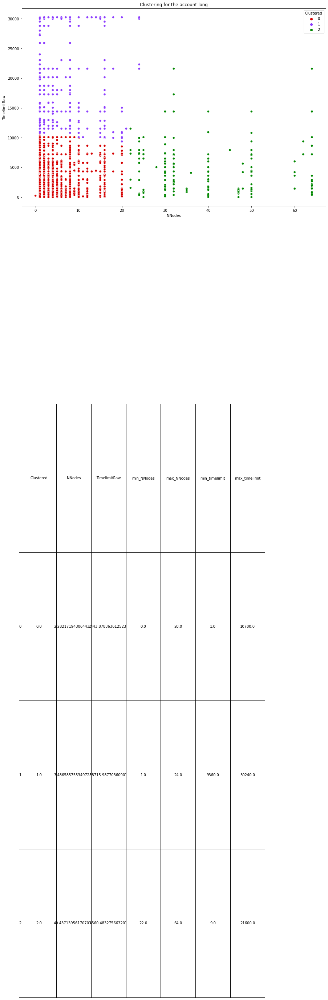

test
(3779, 2)
0.8317491532428827
0.907886718951723
0.922253409861204
0.933644662999475
0.933644662999475
0.937788349234056
0.9393545264499338
0.9404324431291163
0.9448345597708451
0.9643684108596231
0.9672317196514272
0.9703559720801547
0.9710915410541525
0.9710915410541525
0.9710915410541525
0.974224769708653
0.9770570721961697
0.9783497111890175
0.979185412562287
0.9801106807745297
0.9801106807745297
0.9801106807745297
0.980416396277511
0.9806462705492135
0.9881822287078492
0.9884395052245671
0.9904441992715969
0.9906864018389356
0.9913517984038002
0.9921814107893182
0.9940325409169795
0.9941648510519357
0.9941648510519357
0.9945745271685431
0.9958247634109078
0.9962318715184657
0.9962318715184657
0.9967590895695121
0.9967590895695121
0.9967612822538447
0.9970009682414768
0.9970009682414768
0.9970891748119399
0.9970891748119399
0.9970891748119399
0.9970891748119399
0.9970891748119399
0.9970891748119399


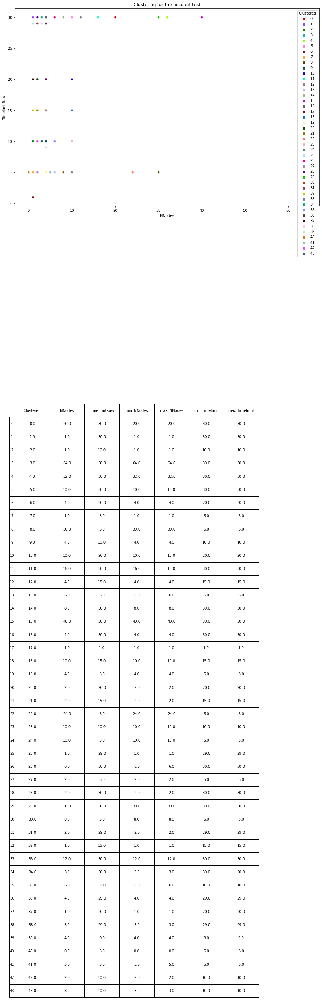

fpgasyn
(5344, 2)
0.7682381579395486
0.7682381579395486
0.8277600800227075
0.8873011372318547
0.8873011372318547
0.890168822505552
0.9141816171793792
0.9273850476410472
0.9394976141862339
0.942261987879269
0.9475970466014098
0.954463947036604
0.9641855505007917
0.966362855267284
0.9701535389529481
0.9737568220788575
0.9768618130204515
0.981068180442619
0.9819814388483571
0.9838791578353416
0.9840657987222753
0.9852610435669557
0.9852610435669557
0.9852610435669557
0.987647313223656
0.9901224115975209
0.991360844088695
0.9916934475865569
0.9924186358874157
0.9930542677962263
0.9938952225715288
0.9942307681883631
0.9964353655779532
0.9978861612181656
0.9979797240924172
0.9981737804241981
0.9982762540483782
0.9982762540483782
0.99835055393193
0.9984895616308179
0.9986080237422724
0.9986080237422724
0.9986080237422724
0.9987131255951399
0.9987674650698641
0.998877245508982
0.998877245508982
0.998877245508982


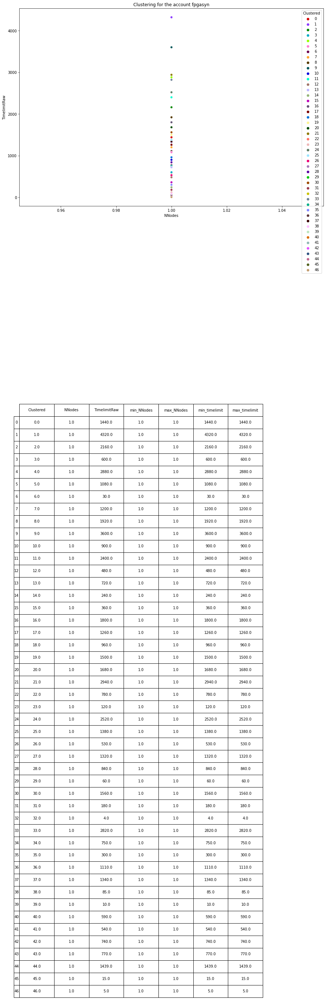

dgx
(1845, 2)
0.9721248627970595
0.9743612541219191
0.9788751594401597
0.9872375411680857
0.9919327132996999
0.9956806252707083
0.9956806252707083
0.9980578106823383
0.9980578106823383
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034
0.9983739805107034


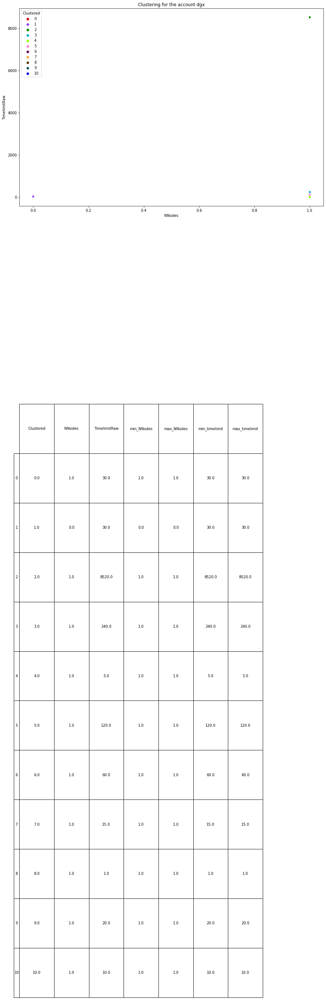

In [27]:
partitions = slurmneg['Partition'].unique()
partitions = partitions.tolist()
function(partitions)

## HDBSCAN for time limit and number of nodes

In [ ]:
def functionn(partitions):
    coun = 0
    sil = 0
    best = 0
    for i in partitions:
        print(i)
        temp = p.loc[p.Partition == i] 
        if len(temp.index) >= 1:
            ClusterData = temp.drop(['Partition'], axis=1)
            print(ClusterData.shape)
            sc_x = StandardScaler()
            ClusterData = sc_x.fit_transform(ClusterData)    
            DB = hdbscan.HDBSCAN(min_samples = 10,cluster_selection_epsilon =0.1,min_cluster_size = 20)
            DB.fit_predict(ClusterData)
            temp['DBcluster'] = pd.Series(DB.labels_, index=temp.index)
            a = temp['DBcluster'].value_counts()
            print(a)
            temp['Min nodes'] = temp[['NNodes']]
            temp['Max nodes'] = temp[['NNodes']]
            temp['Min timelimit'] = temp[['TimelimitRaw']]
            temp['Max timelimit'] = temp[['TimelimitRaw']]
            temp2 = temp.groupby('DBcluster', as_index=False).agg({'NNodes':'mean','TimelimitRaw':'mean','Min nodes':'min','Max nodes':'max','Min timelimit':'min','Max timelimit':'max'})
            temp2['Min nodes'] = temp2['Min nodes'].astype(int)
            temp2['Max nodes'] = temp2['Max nodes'].astype(int)
            temp2['Min timelimit'] = temp2['Min timelimit'].astype(int)
            temp2['Max timelimit'] = temp2['Max timelimit'].astype(int)
            temp2['NNodes'] = temp2['NNodes'].astype(int)
            temp2['TimelimitRaw'] = temp2['TimelimitRaw'].astype(int)
            rcParams['figure.figsize'] = 20, 10
            palette = sns.color_palette(cc.glasbey, n_colors=len(a))
            ax = sns.scatterplot(x='NNodes', y='TimelimitRaw', hue='DBcluster',data=temp,palette=palette,legend = False)
            ax.set(title='Clustering for the account {}'.format(i))
            ax.set_xlabel("Nodes", fontsize = 12)
            ax.set_ylabel("Time limit in minutes", fontsize = 12)
            the_table = plt.table(cellText=temp2.values,
            rowLabels=temp2.index,
            colLabels=temp2.columns,
            cellLoc = 'center', rowLoc = 'center',
            bbox = ([0.25, -6, 0.5, 5]),loc='bottom')
            the_table.auto_set_font_size(False)
            the_table.set_fontsize(10)
            print("Plotted")
            if not os.path.exists('HDB_Part'):
                os.makedirs('HDB_Part')
            plt.savefig('HDB_Part/{}_HDB.png' .format(i),bbox_inches='tight', dpi=100)
            plt.show()    

In [ ]:
partitions = slurmneg['Partition'].unique()
partitions = partitions.tolist()
functionn(partitions)

In [28]:
def function_ch(partitions):
    coun = 0
    sil = 0
    best = 0
    for i in partitions:
        print(i)
        temp = p.loc[p.Partition == i] 
        if len(temp.index) >= 1:
            ClusterData = temp.drop(['Partition'], axis=1)
            print(ClusterData.shape)
            sc_x = StandardScaler()
            ClusterData = sc_x.fit_transform(ClusterData)    
            DB = hdbscan.HDBSCAN(min_samples = 10,cluster_selection_epsilon =0.1,min_cluster_size = 20)
            DB.fit_predict(ClusterData)
            temp['DBcluster'] = pd.Series(DB.labels_, index=temp.index)
            a = temp['DBcluster'].value_counts()
            print(a)
            temp['min_NNodes'] = temp[['NNodes']]
            temp['max_NNodes'] = temp[['NNodes']]
            temp['min_timelimit'] = temp[['TimelimitRaw']]
            temp['max_timelimit'] = temp[['TimelimitRaw']]
            temp2 = temp.groupby('DBcluster', as_index=False).agg({'NNodes':'mean','TimelimitRaw':'mean','min_NNodes':'min','max_NNodes':'max','min_timelimit':'min','max_timelimit':'max'})
            temp2['min_NNodes'] = temp2['min_NNodes'].astype(int)
            temp2['max_NNodes'] = temp2['max_NNodes'].astype(int)
            temp2['min_timelimit'] = temp2['min_timelimit'].astype(int)
            temp2['max_timelimit'] = temp2['max_timelimit'].astype(int)
            temp2['NNodes'] = temp2['NNodes'].astype(int)
            temp2['TimelimitRaw'] = temp2['TimelimitRaw'].astype(int)
            rcParams['figure.figsize'] = 20, 10
            palette = sns.color_palette(cc.glasbey, n_colors=len(a))
            Clustered = temp['DBcluster'].unique()
            Clustered = Clustered.tolist()
            for c in Clustered:
                aa = temp[(temp['DBcluster'] == c)]
                cpy = aa.copy()
                aa = list(zip(aa['NNodes'],aa['TimelimitRaw']))
                aa = [list(elem) for elem in aa]
                res1, res2 = map(list, zip(*aa))
                res = all(ele == res1[0] for ele in res1)
                ress = all(ele == res2[0] for ele in res2)
                result = all(element == aa[0] for element in aa)
                aa = np.array(aa)
                plt.plot(aa[:,0], aa[:,1], '*',markersize=5)
                plt.xlabel('nodes')
                plt.ylabel('Timelimit in minutes')
                if not result | ress | res:
                    hull = ConvexHull(aa,qhull_options='QJ')
                    for simplex in hull.simplices:
                        plt.plot(aa[simplex, 0], aa[simplex, 1], 'k-')
                if res | ress:   
                    plt.plot(cpy['NNodes'], cpy['TimelimitRaw'])    
            the_table = plt.table(cellText=temp2.values,
            rowLabels=temp2.index,
            colLabels=temp2.columns,
            cellLoc = 'center', rowLoc = 'center',
            bbox = ([0.25, -6, 0.5, 5]),loc='bottom')
            the_table.auto_set_font_size(False)
            the_table.set_fontsize(10)
            print("Plotted")
            if not os.path.exists('Convex_hull_HDB_Part'):
                os.makedirs('Convex_hull_HDB_Part')
            plt.savefig('Convex_hull_HDB_Part/{}_HDB.png' .format(i),bbox_inches='tight', dpi=100)
            plt.show()    

long
(75768, 2)
 82     42330
 35      8711
 80      4482
 98      2814
 96      2515
 86      1745
 43      1596
 73      1042
 95       832
 36       825
 71       760
-1        453
 100      451
 62       450
 72       438
 99       308
 77       297
 67       287
 65       287
 15       266
 60       256
 74       225
 37       195
 81       192
 76       173
 33       157
 8        152
 44       150
 28       143
 17       115
 0        112
 23       105
 91       101
 61        94
 42        86
 92        83
 3         82
 34        79
 49        77
 89        67
 13        64
 78        64
 54        63
 53        55
 41        54
 10        53
 22        52
 40        47
 79        47
 26        47
 30        46
 58        46
 75        45
 87        44
 14        44
 94        43
 29        43
 32        43
 21        43
 19        43
 93        42
 68        42
 85        42
 52        42
 46        42
 7         40
 70        39
 56        37
 11        36
 1         36
 50 

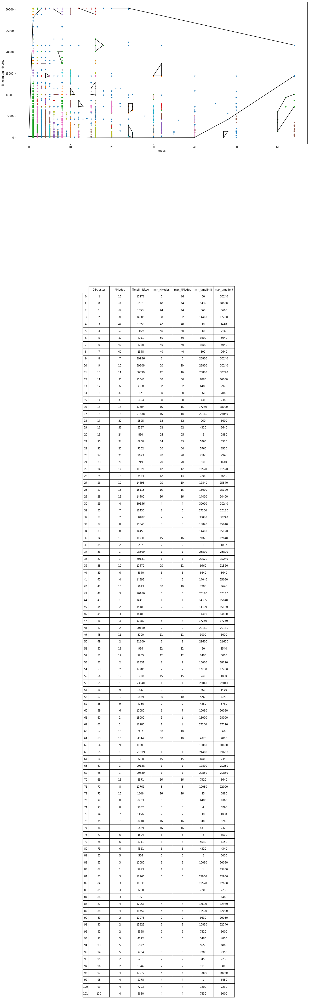

batch
(388056, 2)
 73     201923
 72     102121
 94      19190
 144      6156
 134      5511
 138      4974
 80       4832
 136      3264
 107      2953
 85       2630
 131      2580
 103      2459
 119      1452
 127      1389
 91       1366
 86       1178
 141      1095
 75       1045
 128       982
 123       833
 130       820
 55        673
 50        585
 97        585
 114       569
-1         566
 111       551
 95        520
 87        509
 117       489
 54        455
 96        454
 110       450
 126       439
 69        415
 49        401
 43        400
 82        391
 58        386
 67        374
 84        366
 64        358
 62        354
 61        353
 68        352
 32        350
 41        323
 92        306
 143       274
 121       257
 146       215
 42        214
 53        212
 77        211
 60        202
 78        189
 90        160
 112       149
 30        149
 120       147
 140       141
 23        136
 24        134
 118       134
 101       134
 106   

KeyboardInterrupt: 

In [29]:
partitions = slurmneg['Partition'].unique()
partitions = partitions.tolist()
function_ch(partitions)

In [34]:
def function_ch2(partitions):
    coun = 0
    sil = 0
    best = 0
    for i in partitions:
        print(i)
        temp = p.loc[p.Partition == i] 
        if len(temp.index) >= 1:
            ClusterData = temp.drop(['Partition'], axis=1)
            print(ClusterData.shape)
            sc_x = StandardScaler()
            ClusterData = sc_x.fit_transform(ClusterData)    
            DB = hdbscan.HDBSCAN(min_samples = 10,cluster_selection_epsilon =0.1,min_cluster_size = 20)
            DB.fit_predict(ClusterData)
            temp['DBcluster'] = pd.Series(DB.labels_, index=temp.index)
            a = temp['DBcluster'].value_counts()
            print(a)
            temp['Min nodes'] = temp[['NNodes']]
            temp['Max nodes'] = temp[['NNodes']]
            temp['Min timelimit'] = temp[['TimelimitRaw']]
            temp['Max timelimit'] = temp[['TimelimitRaw']]
            temp2 = temp.groupby('DBcluster', as_index=False).agg({'NNodes':'mean','TimelimitRaw':'mean','Min nodes':'min','Max nodes':'max','Min timelimit':'min','Max timelimit':'max'})
            temp2['Min nodes'] = temp2['Min nodes'].astype(int)
            temp2['Max nodes'] = temp2['Max nodes'].astype(int)
            temp2['Min timelimit'] = temp2['Min timelimit'].astype(int)
            temp2['Max timelimit'] = temp2['Max timelimit'].astype(int)
            temp2['NNodes'] = temp2['NNodes'].astype(int)
            temp2['TimelimitRaw'] = temp2['TimelimitRaw'].astype(int)
            rcParams['figure.figsize'] = 15, 10
            palette = sns.color_palette(cc.glasbey, n_colors=len(a))
            Clustered = temp['DBcluster'].unique()
            Clustered = Clustered.tolist()
            for c in Clustered:
                aa = temp[(temp['DBcluster'] == c)]
                cpy = aa.copy()
                aa = list(zip(aa['NNodes'],aa['TimelimitRaw']))
                aa = [list(elem) for elem in aa]
                res1, res2 = map(list, zip(*aa))
                res = all(ele == res1[0] for ele in res1)
                ress = all(ele == res2[0] for ele in res2)
                result = all(element == aa[0] for element in aa)
                aa = np.array(aa)
                if result:
                    
                    plt.plot(aa[:,0], aa[:,1], '*',markersize=5)
                plt.xlabel('Nodes',size = 16)
                plt.ylabel('Time limit in minutes',size = 16)
                if not result | ress | res:
                    hull = ConvexHull(aa,qhull_options='QJ')
                    for simplex in hull.simplices:
                        plt.plot(aa[simplex, 0], aa[simplex, 1], 'k-')
                if res | ress:   
                    plt.plot(cpy['NNodes'], cpy['TimelimitRaw'])    
            the_table = plt.table(cellText=temp2.values,
            rowLabels=temp2.index,
            colLabels=temp2.columns,
            cellLoc = 'center', rowLoc = 'center',
            bbox = ([0.25, -6, 0.5, 5]),loc='bottom')
            the_table.auto_set_font_size(False)
            the_table.set_fontsize(10)
            print("Plotted")
            if not os.path.exists('Convex2_hull_HDB_Part'):
                os.makedirs('Convex2_hull_HDB_Part')
            plt.savefig('Convex2_hull_HDB_Part/{}_HDB.png' .format(i),bbox_inches='tight', dpi=100)
            plt.show()    

long
(75768, 2)
 82     42330
 35      8711
 80      4482
 98      2814
 96      2515
 86      1745
 43      1596
 73      1042
 95       832
 36       825
 71       760
-1        453
 100      451
 62       450
 72       438
 99       308
 77       297
 67       287
 65       287
 15       266
 60       256
 74       225
 37       195
 81       192
 76       173
 33       157
 8        152
 44       150
 28       143
 17       115
 0        112
 23       105
 91       101
 61        94
 42        86
 92        83
 3         82
 34        79
 49        77
 89        67
 13        64
 78        64
 54        63
 53        55
 41        54
 10        53
 22        52
 40        47
 79        47
 26        47
 30        46
 58        46
 75        45
 87        44
 14        44
 94        43
 29        43
 32        43
 21        43
 19        43
 93        42
 68        42
 85        42
 52        42
 46        42
 7         40
 70        39
 56        37
 11        36
 1         36
 50 

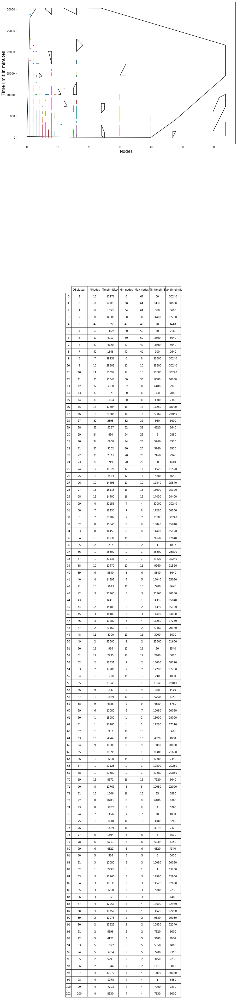

batch
(388056, 2)
 73     201923
 72     102121
 94      19190
 144      6156
 134      5511
 138      4974
 80       4832
 136      3264
 107      2953
 85       2630
 131      2580
 103      2459
 119      1452
 127      1389
 91       1366
 86       1178
 141      1095
 75       1045
 128       982
 123       833
 130       820
 55        673
 50        585
 97        585
 114       569
-1         566
 111       551
 95        520
 87        509
 117       489
 54        455
 96        454
 110       450
 126       439
 69        415
 49        401
 43        400
 82        391
 58        386
 67        374
 84        366
 64        358
 62        354
 61        353
 68        352
 32        350
 41        323
 92        306
 143       274
 121       257
 146       215
 42        214
 53        212
 77        211
 60        202
 78        189
 90        160
 112       149
 30        149
 120       147
 140       141
 23        136
 24        134
 118       134
 101       134
 106   

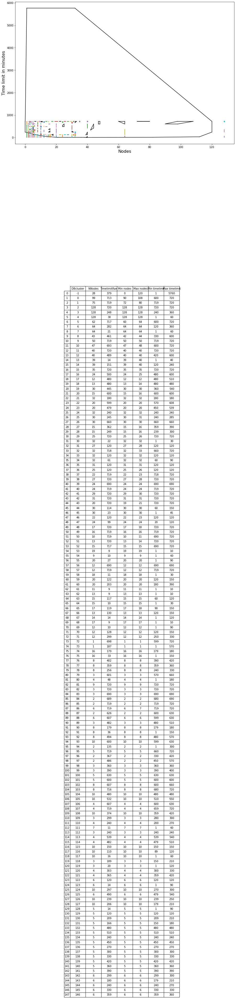

fpga
(33097, 2)
 22    22123
 21     6147
 16     1635
 15      834
 18      389
 12      317
 9       214
 10      211
 0       210
 11      172
 8       159
 7       138
 17       86
 2        61
 20       61
 6        57
 4        57
 3        46
 19       42
 5        34
 1        31
 13       28
-1        25
 14       20
Name: DBcluster, dtype: int64
Plotted


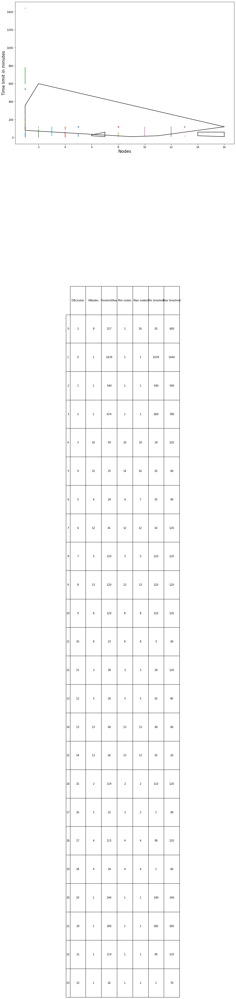

all
(33389, 2)
 18    19131
 21     8149
 9      3250
 12      883
 2       471
 4       225
 17      177
 8       159
 0       112
 3        92
 14       91
-1        86
 20       85
 11       74
 6        70
 5        69
 16       48
 1        46
 15       44
 7        37
 10       34
 13       34
 19       22
Name: DBcluster, dtype: int64
Plotted


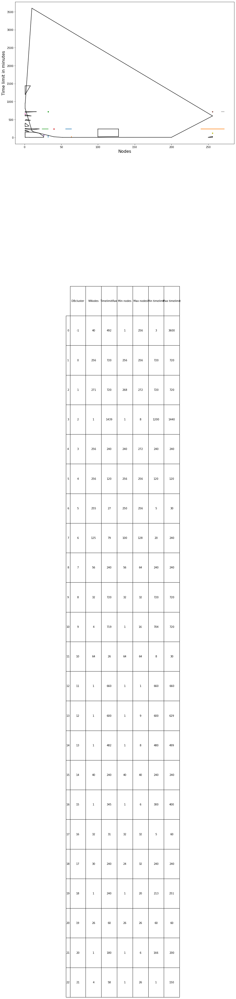

short
(345082, 2)
 2    206001
 3    100313
 0     32134
 7      4557
 6      1096
 5       555
 4       308
 1       102
-1        16
Name: DBcluster, dtype: int64
Plotted


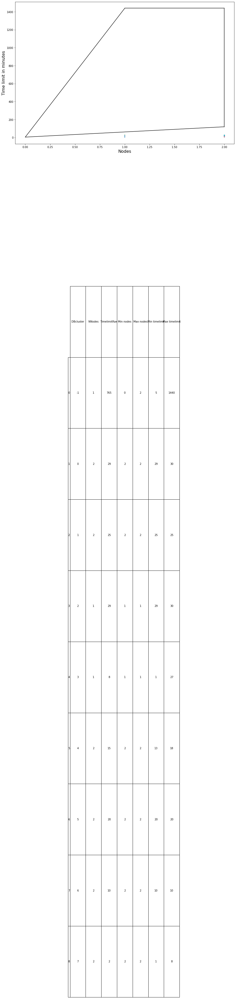

test
(3779, 2)
 13    2626
 9      517
 8      100
 1       67
 6       64
 10      62
 4       61
 0       60
-1       56
 5       41
 3       35
 2       24
 7       23
 11      22
 12      21
Name: DBcluster, dtype: int64
Plotted


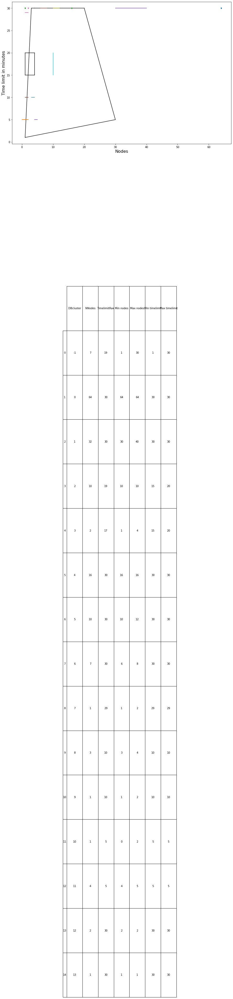

fpgasyn
(5344, 2)
 6    3157
 3     619
 0     379
 1     352
 8     262
 7     205
 5     155
 4     132
 2      53
-1      30
Name: DBcluster, dtype: int64
Plotted


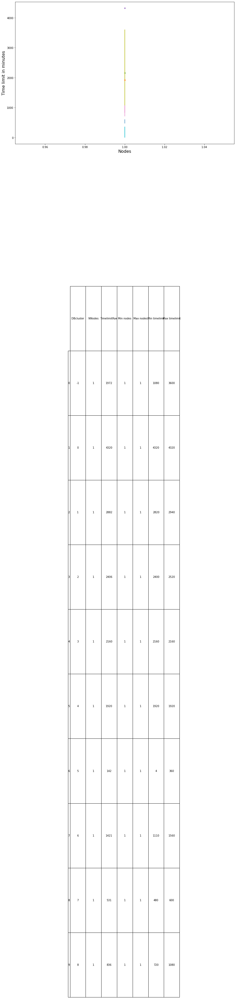

dgx
(1845, 2)
 2    1590
 1     234
 0      20
-1       1
Name: DBcluster, dtype: int64
Plotted


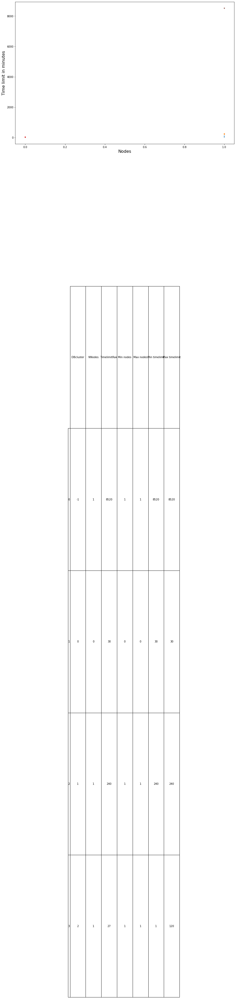

In [35]:
partitions = slurmneg['Partition'].unique()
partitions = partitions.tolist()
function_ch2(partitions)

## HDBSCAN for nodes and run time

In [ ]:
def functionn2(partitions):
    coun = 0
    sil = 0
    best = 0
    for i in partitions:
        print(i)
        temp = pj.loc[pj.Partition == i] 
        if len(temp.index) >= 1:
            ClusterData = temp.drop(['Partition'], axis=1)
            print(ClusterData.shape)
            sc_x = StandardScaler()
            ClusterData = sc_x.fit_transform(ClusterData)    
            DB = hdbscan.HDBSCAN(min_samples = 10,cluster_selection_epsilon =0.1,min_cluster_size = 20)
            DB.fit_predict(ClusterData)
            temp['DBcluster'] = pd.Series(DB.labels_, index=temp.index)
            a = temp['DBcluster'].value_counts()
            print(a)
            temp['Min nodes'] = temp[['NNodes']]
            temp['Max nodes'] = temp[['NNodes']]
            temp['Min job length'] = temp[['JobLen']]
            temp['Max job length'] = temp[['JobLen']]
            temp2 = temp.groupby('DBcluster', as_index=False).agg({'NNodes':'mean','JobLen':'mean','Min nodes':'min','Max nodes':'max','Min job length':'min','Max job length':'max'})
            temp2['Min nodes'] = temp2['Min nodes'].astype(int)
            temp2['Max nodes'] = temp2['Max nodes'].astype(int)
            temp2['Min job length'] = temp2['Min job length'].astype(int)
            temp2['Max job length'] = temp2['Max job length'].astype(int)
            temp2['NNodes'] = temp2['NNodes'].astype(int)
            temp2['JobLen'] = temp2['JobLen'].astype(int)
            rcParams['figure.figsize'] = 20, 10
            palette = sns.color_palette(cc.glasbey, n_colors=len(a))
            Clustered = temp['DBcluster'].unique()
            Clustered = Clustered.tolist()
            for c in Clustered:
                aa = temp[(temp['DBcluster'] == c)]
                cpy = aa.copy()
                aa = list(zip(aa['NNodes'],aa['JobLen']))
                aa = [list(elem) for elem in aa]
                res1, res2 = map(list, zip(*aa))
                res = all(ele == res1[0] for ele in res1)
                ress = all(ele == res2[0] for ele in res2)
                result = all(element == aa[0] for element in aa)
                aa = np.array(aa)
                if result:
                    
                    plt.plot(aa[:,0], aa[:,1], '*',markersize=5)
                plt.xlabel('Nodes')
                plt.ylabel('Run time in seconds')
                if not result | ress | res:
                    hull = ConvexHull(aa,qhull_options='QJ')
                    for simplex in hull.simplices:
                        plt.plot(aa[simplex, 0], aa[simplex, 1], 'k-')
                if res | ress:   
                    plt.plot(cpy['NNodes'], cpy['JobLen'])    
            the_table = plt.table(cellText=temp2.values,
            rowLabels=temp2.index,
            colLabels=temp2.columns,
            cellLoc = 'center', rowLoc = 'center',
            bbox = ([0.25, -6, 0.5, 5]),loc='bottom')
            the_table.auto_set_font_size(False)
            the_table.set_fontsize(10)
            print("Plotted")
            if not os.path.exists('jl_HDB_Part'):
                os.makedirs('jl_HDB_Part')
            plt.savefig('jl_HDB_Part/{}_HDB.png' .format(i),bbox_inches='tight', dpi=100)
            plt.show()    

In [ ]:
partitions = slurmneg['Partition'].unique()
partitions = partitions.tolist()
functionn2(partitions)

## According to Individual projects

In [36]:
c = slurmnegg[['Account','NNodes','TimelimitRaw']]

## K-Means for time limit and nodes

In [ ]:
def function2(accounts):
    coun = 0
    sil = 0
    best = 0
    for i in accounts:
        print(i)
        temp = c.loc[c.Account == i] 
        if len(temp.index) >= 20:
            ClusterData = temp.drop(['Account'], axis=1)
            print(ClusterData.shape)
            sc_x = StandardScaler()
            ClusterData = sc_x.fit_transform(ClusterData)
            silhouette_avg = []
            K = range(2,50)
            for num_clusters in K:
                kmeans = KMeans(n_clusters=num_clusters)
                kmeans.fit(ClusterData)
                cluster_labels = kmeans.labels_
                sil = silhouette_score(ClusterData, cluster_labels)
                silhouette_avg.append(sil)
                max_value = max(silhouette_avg)
                print(max_value)
                best = silhouette_avg.index(max_value) + 2
            
            kmeans = KMeans(n_clusters=best)
            kmeans.fit(ClusterData)
            temp['Clustered'] = pd.Series(kmeans.labels_, index=temp.index)
            temp['min_NNodes'] = temp[['NNodes']]
            temp['max_NNodes'] = temp[['NNodes']]
            temp['min_timelimit'] = temp[['TimelimitRaw']]
            temp['max_timelimit'] = temp[['TimelimitRaw']]
            temp2 = temp.groupby('Clustered', as_index=False).agg({'NNodes':'mean','TimelimitRaw':'mean','min_NNodes':'min','max_NNodes':'max','min_timelimit':'min','max_timelimit':'max'})
            rcParams['figure.figsize'] = 60, 10
            palette = sns.color_palette(cc.glasbey, n_colors=best)
            sns.scatterplot(x='NNodes', y='TimelimitRaw', hue='Clustered',data=temp,palette=palette).set(title='Clustering for the account {}'.format(i))
            the_table = plt.table(cellText=temp2.values,
            rowLabels=temp2.index,
            colLabels=temp2.columns,
            cellLoc = 'center', rowLoc = 'center',
            bbox = ([0, -4, 0.8, 3]),loc='bottom')
            the_table.auto_set_font_size(False)
            the_table.set_fontsize(10)
            if not os.path.exists('clustering_Accounts_2'):
                os.makedirs('clustering_Accounts_2')
            plt.savefig('clustering_Accounts_2/{}_clustering_Accounts.png' .format(i),bbox_inches='tight', dpi=100)
            plt.show()    

In [ ]:
accounts = slurmneg['Account'].unique()
accounts = accounts.tolist()
function2(accounts)

## HDBSCAN for nodes and time limit

In [ ]:
def function3(accounts):
    coun = 0
    sil = 0
    best = 0
    for i in accounts:
        print(i)
        temp = c.loc[c.Account == i] 
        if len(temp.index) >= 1:
            ClusterData = temp.drop(['Account'], axis=1)
            print(ClusterData.shape)
            sc_x = StandardScaler()
            ClusterData = sc_x.fit_transform(ClusterData)    
            DB = hdbscan.HDBSCAN(min_samples = 5,cluster_selection_epsilon =0.1,min_cluster_size = 5)
            DB.fit_predict(ClusterData)
            temp['DBcluster'] = pd.Series(DB.labels_, index=temp.index)
            a = temp['DBcluster'].value_counts()
            print(a)
            temp['Min nodes'] = temp[['NNodes']]
            temp['Max nodes'] = temp[['NNodes']]
            temp['Min timelimit'] = temp[['TimelimitRaw']]
            temp['Max timelimit'] = temp[['TimelimitRaw']]
            temp2 = temp.groupby('DBcluster', as_index=False).agg({'NNodes':'mean','TimelimitRaw':'mean','Min nodes':'min','Max nodes':'max','Min timelimit':'min','Max timelimit':'max'})
            temp2['Min nodes'] = temp2['Min nodes'].astype(int)
            temp2['Max nodes'] = temp2['Max nodes'].astype(int)
            temp2['Min timelimit'] = temp2['Min timelimit'].astype(int)
            temp2['Max timelimit'] = temp2['Max timelimit'].astype(int)
            temp2['NNodes'] = temp2['NNodes'].astype(int)
            temp2['TimelimitRaw'] = temp2['TimelimitRaw'].astype(int)
            rcParams['figure.figsize'] = 20, 10
            palette = sns.color_palette(cc.glasbey, n_colors=len(a))
            Clustered = temp['DBcluster'].unique()
            Clustered = Clustered.tolist()
            for cl in Clustered:
                aa = temp[(temp['DBcluster'] == cl)]
                cpy = aa.copy()
                aa = list(zip(aa['NNodes'],aa['TimelimitRaw']))
                aa = [list(elem) for elem in aa]
                res1, res2 = map(list, zip(*aa))
                res = all(ele == res1[0] for ele in res1)
                ress = all(ele == res2[0] for ele in res2)
                result = all(element == aa[0] for element in aa)
                aa = np.array(aa)
                if result:
                    
                    plt.plot(aa[:,0], aa[:,1], '*',markersize=5)
                plt.xlabel('Nodes')
                plt.ylabel('Time limit in minutes')
                if not result | ress | res:
                    hull = ConvexHull(aa,qhull_options='QJ')
                    for simplex in hull.simplices:
                        plt.plot(aa[simplex, 0], aa[simplex, 1], 'k-')
                if res | ress:   
                    plt.plot(cpy['NNodes'], cpy['TimelimitRaw'])    
            the_table = plt.table(cellText=temp2.values,
            rowLabels=temp2.index,
            colLabels=temp2.columns,
            cellLoc = 'center', rowLoc = 'center',
            bbox = ([0.25, -6, 0.5, 5]),loc='bottom')
            the_table.auto_set_font_size(False)
            the_table.set_fontsize(10)
            print("Plotted")
            if not os.path.exists('HDB'):
                os.makedirs('HDB')
            plt.savefig('HDB/{}_HDB.png' .format(i),bbox_inches='tight', dpi=100)
            plt.show()    

In [ ]:
accounts = slurmneg['Account'].unique()
accounts = accounts.tolist()
function3(accounts)

In [37]:
jl = slurmnegg[['Account','NNodes','JobLen']]

## K-Means for nodes and job length

In [ ]:
def function4(accounts):
    coun = 0
    sil = 0
    best = 0
    for i in accounts:
        print(i)
        temp = jl.loc[jl.Account == i] 
        if len(temp.index) >= 20:
            ClusterData = temp.drop(['Account'], axis=1)
            print(ClusterData.shape)
            sc_x = StandardScaler()
            ClusterData = sc_x.fit_transform(ClusterData)
            silhouette_avg = []
            K = range(2,50)
            for num_clusters in K:
                kmeans = KMeans(n_clusters=num_clusters)
                kmeans.fit(ClusterData)
                cluster_labels = kmeans.labels_
                sil = silhouette_score(ClusterData, cluster_labels)
                silhouette_avg.append(sil)
                max_value = max(silhouette_avg)
                print(max_value)
                best = silhouette_avg.index(max_value) + 2
            
            kmeans = KMeans(n_clusters=best)
            kmeans.fit(ClusterData)
            temp['Clustered'] = pd.Series(kmeans.labels_, index=temp.index)
            rcParams['figure.figsize'] = 60, 10
            palette = sns.color_palette(cc.glasbey, n_colors=best)
            sns.scatterplot(x='NNodes', y='JobLen', hue='Clustered',data=temp,palette=palette).set(title='Clustering for the account {}'.format(i))
            print("Plotted")
            if not os.path.exists('clustering_Accounts_4'):
                os.makedirs('clustering_Accounts_4')
            plt.savefig('clustering_Accounts_4/{}_clustering_Accounts.png' .format(i))
            plt.show()    

In [ ]:
accounts = slurmneg['Account'].unique()
accounts = accounts.tolist()
function4(accounts)

## HDBSCAN for nodes and job length

In [40]:
def functionjl(accounts):
    coun = 0
    sil = 0
    best = 0
    for i in accounts:
        print(i)
        temp = jl.loc[jl.Account == i] 
        if len(temp.index) >= 1:
            ClusterData = temp.drop(['Account'], axis=1)
            print(ClusterData.shape)
            sc_x = StandardScaler()
            ClusterData = sc_x.fit_transform(ClusterData)    
            DB = hdbscan.HDBSCAN(min_samples = 5,cluster_selection_epsilon =0.1,min_cluster_size = 5)
            DB.fit_predict(ClusterData)
            temp['DBcluster'] = pd.Series(DB.labels_, index=temp.index)
            a = temp['DBcluster'].value_counts()
            print(a)
            temp['Min nodes'] = temp[['NNodes']]
            temp['Max nodes'] = temp[['NNodes']]
            temp['Min job length'] = temp[['JobLen']]
            temp['Max job length'] = temp[['JobLen']]
            temp2 = temp.groupby('DBcluster', as_index=False).agg({'NNodes':'mean','JobLen':'mean','Min nodes':'min','Max nodes':'max','Min job length':'min','Max job length':'max'})
            temp2['Min nodes'] = temp2['Min nodes'].astype(int)
            temp2['Max nodes'] = temp2['Max nodes'].astype(int)
            temp2['Min job length'] = temp2['Min job length'].astype(int)
            temp2['Max job length'] = temp2['Max job length'].astype(int)
            temp2['NNodes'] = temp2['NNodes'].astype(int)
            temp2['JobLen'] = temp2['JobLen'].astype(int)
            rcParams['figure.figsize'] = 15, 10
            palette = sns.color_palette(cc.glasbey, n_colors=len(a))
            Clustered = temp['DBcluster'].unique()
            Clustered = Clustered.tolist()
            for c in Clustered:
                aa = temp[(temp['DBcluster'] == c)]
                cpy = aa.copy()
                aa = list(zip(aa['NNodes'],aa['JobLen']))
                aa = [list(elem) for elem in aa]
                res1, res2 = map(list, zip(*aa))
                res = all(ele == res1[0] for ele in res1)
                ress = all(ele == res2[0] for ele in res2)
                result = all(element == aa[0] for element in aa)
                aa = np.array(aa)
                if result:
                    
                    plt.plot(aa[:,0], aa[:,1], '*',markersize=5)
                plt.xlabel('Nodes',size = 16)
                plt.ylabel('Runtime in seconds',size = 16)
                if not result | ress | res:
                    hull = ConvexHull(aa,qhull_options='QJ')
                    for simplex in hull.simplices:
                        plt.plot(aa[simplex, 0], aa[simplex, 1], 'k-')
                if res | ress:   
                    plt.plot(cpy['NNodes'], cpy['JobLen'])    
            the_table = plt.table(cellText=temp2.values,
            rowLabels=temp2.index,
            colLabels=temp2.columns,
            cellLoc = 'center', rowLoc = 'center',
            bbox = ([0.25, -6, 0.5, 5]),loc='bottom')
            the_table.auto_set_font_size(False)
            the_table.set_fontsize(10)
            print("Plotted")
            if not os.path.exists('HDB_lj'):
                os.makedirs('HDB_lj')
            plt.savefig('HDB_lj/{}_HDB.png' .format(i),bbox_inches='tight', dpi=100)
            plt.show()    

72
(20999, 2)
 74    15307
 76     2106
 78     1165
 71      182
 12      175
 52      155
-1       123
 67      110
 58      106
 14      100
 51       89
 59       87
 43       78
 6        74
 70       47
 34       46
 54       41
 46       38
 56       38
 45       35
 38       35
 77       32
 75       32
 13       30
 66       29
 61       29
 47       28
 60       28
 62       27
 16       24
 3        24
 18       22
 11       22
 4        22
 29       20
 73       19
 48       18
 19       18
 5        18
 39       17
 22       17
 30       17
 63       16
 8        16
 53       15
 33       15
 0        14
 42       14
 41       13
 72       13
 1        13
 55       13
 40       12
 31       11
 35       11
 10       11
 24       10
 28       10
 21       10
 23       10
 7        10
 37        9
 27        8
 49        8
 65        8
 9         8
 26        7
 17        7
 57        7
 20        7
 32        7
 2         7
 25        7
 50        6
 44        6
 64        

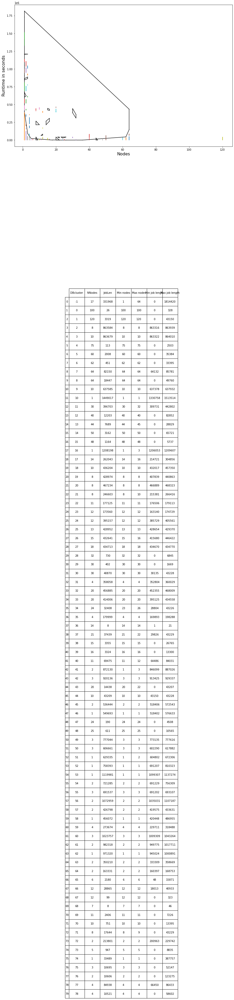

37
(6667, 2)
 19    2904
 29    2416
 25     460
 17     237
 15     102
 20      66
-1       63
 16      57
 9       45
 24      33
 8       32
 7       31
 11      20
 27      20
 5       19
 10      19
 22      19
 23      16
 6       15
 2       14
 14      11
 13      11
 4        8
 18       7
 12       6
 26       6
 28       6
 3        6
 1        6
 0        6
 21       6
Name: DBcluster, dtype: int64
Plotted


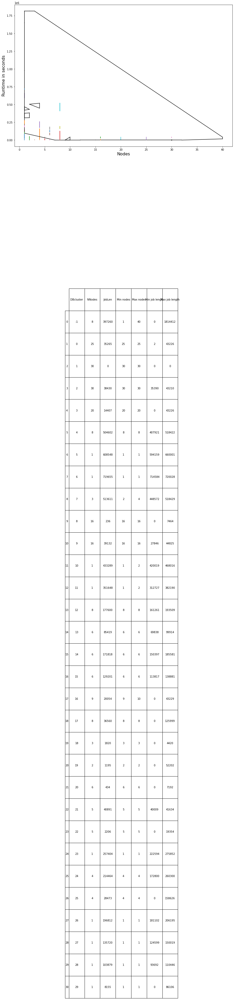

15
(35566, 2)
 45    16709
 44     7757
 43     3284
 56     2481
 47     2218
 24     1441
 51      186
 55      171
-1       113
 15      109
 11       94
 40       93
 42       78
 9        67
 49       47
 14       44
 13       44
 48       43
 34       42
 41       41
 16       35
 5        32
 20       30
 38       28
 26       24
 7        24
 30       23
 29       20
 39       19
 54       19
 0        18
 4        14
 19       14
 33       14
 22       14
 28       13
 46       11
 12       10
 31       10
 37       10
 3         9
 8         8
 17        8
 53        8
 6         8
 18        7
 35        7
 1         7
 21        7
 27        7
 23        7
 10        6
 36        6
 32        6
 52        6
 50        5
 25        5
 2         5
Name: DBcluster, dtype: int64
Plotted


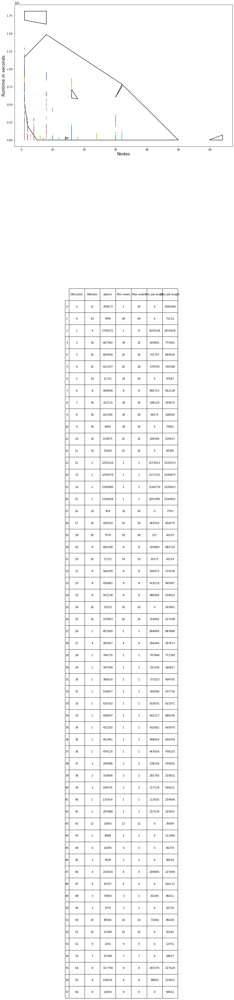

2
(492, 2)
 1    320
 0    158
-1     14
Name: DBcluster, dtype: int64
Plotted


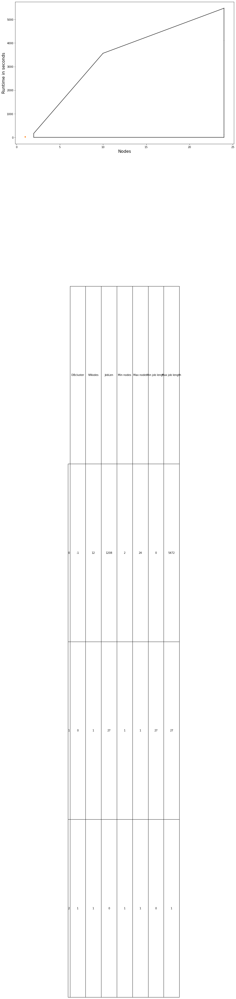

42
(782, 2)
 8     294
 2     179
 1     155
 7      66
-1      23
 0      16
 6      11
 3       9
 5       8
 9       8
 4       7
 10      6
Name: DBcluster, dtype: int64
Plotted


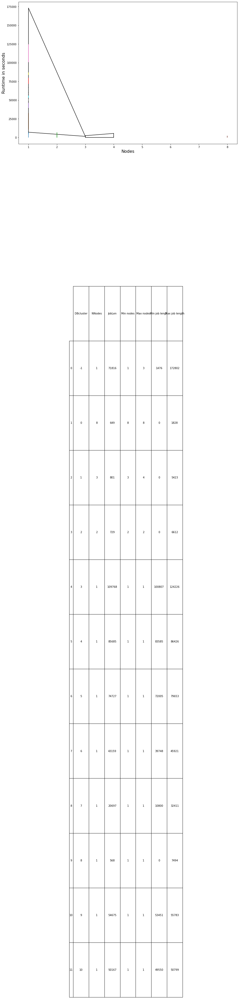

81
(66765, 2)
 18    65753
 8       453
 13      100
 2        76
-1        62
 12       59
 14       35
 20       34
 6        31
 7        29
 15       17
 19       16
 11       14
 0        14
 4        13
 17       12
 9        12
 10       11
 5         7
 1         6
 3         6
 16        5
Name: DBcluster, dtype: int64
Plotted


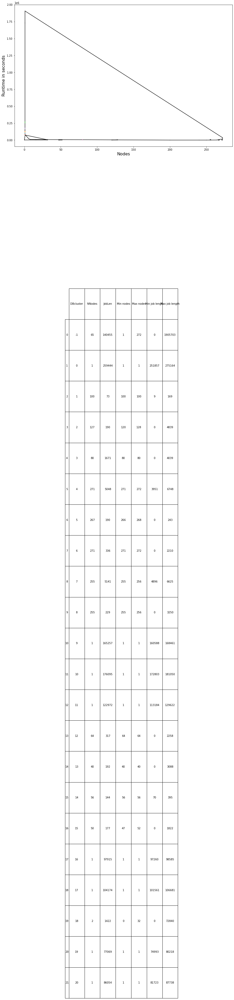

39
(59846, 2)
 55    55984
 32     1086
 24      482
 27      271
 58      241
-1       197
 41      180
 44      170
 6       154
 45       74
 0        56
 56       46
 50       39
 37       35
 22       34
 11       33
 33       32
 19       32
 51       28
 26       27
 43       26
 15       25
 9        24
 38       23
 57       23
 25       23
 40       23
 28       22
 42       22
 54       22
 31       22
 46       21
 36       21
 39       21
 34       21
 29       21
 49       21
 13       20
 35       20
 52       20
 53       20
 48       20
 30       20
 2        19
 47       18
 16       16
 7         9
 18        8
 20        8
 23        7
 17        7
 10        7
 12        6
 8         6
 3         6
 4         6
 1         6
 21        5
 5         5
 14        5
Name: DBcluster, dtype: int64
Plotted


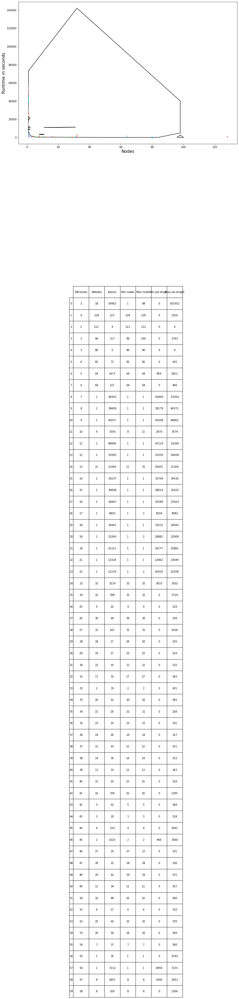

6
(101, 2)
 1    76
 0    20
-1     5
Name: DBcluster, dtype: int64
Plotted


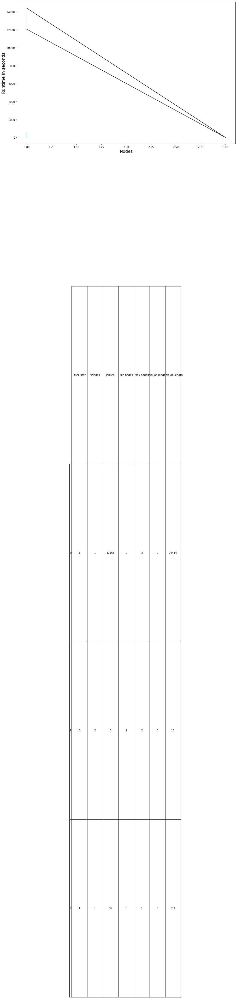

18
(945, 2)
 4    633
 1    183
 6     47
-1     28
 5     20
 3     17
 0     10
 2      7
Name: DBcluster, dtype: int64
Plotted


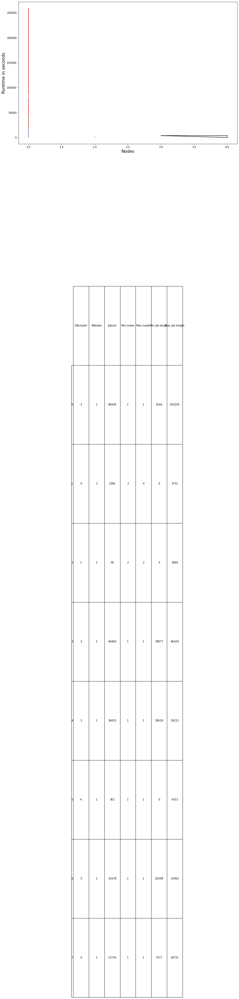

75
(12239, 2)
 13    11816
 2       185
 12       40
-1        38
 14       32
 9        20
 6        16
 8        16
 11       12
 15       11
 4        11
 5         8
 7         8
 0         7
 10        7
 3         6
 1         6
Name: DBcluster, dtype: int64
Plotted


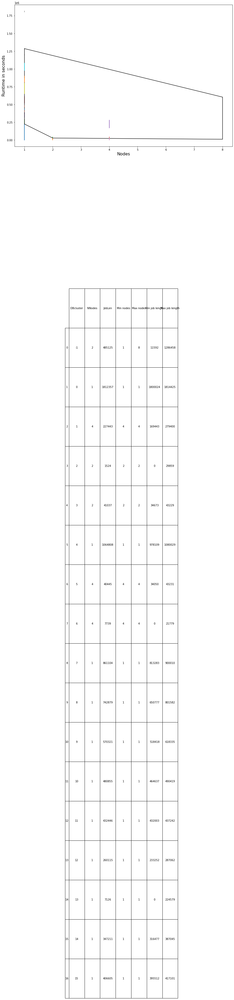

74
(23421, 2)
 30    9794
 23    6052
 28    4085
 29     917
 32     703
 24     412
 11     364
 20     202
-1       80
 35      73
 19      65
 5       57
 9       53
 31      50
 12      50
 34      50
 15      39
 1       37
 26      35
 22      33
 27      33
 21      32
 0       30
 18      26
 8       22
 14      17
 25      15
 10      14
 16      13
 33      13
 13      12
 17      10
 7        9
 6        6
 4        6
 3        6
 2        6
Name: DBcluster, dtype: int64
Plotted


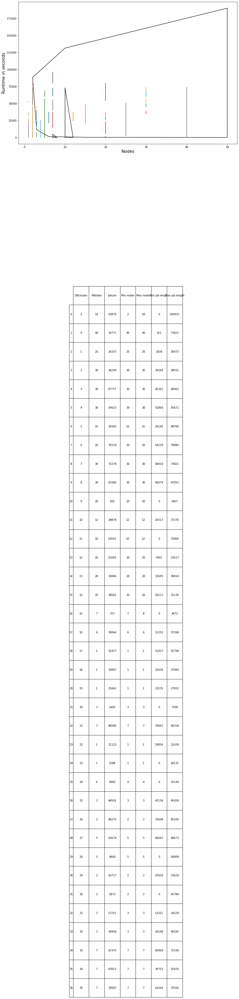

77
(231453, 2)
 37    185061
 69     20858
 46     17969
 86      2352
 51      1050
 49       981
 62       865
 36       345
-1        216
 33       188
 76       110
 28        98
 26        79
 54        62
 45        55
 20        49
 84        42
 88        39
 22        38
 80        38
 31        36
 77        32
 41        30
 29        29
 67        29
 59        28
 39        24
 35        23
 4         22
 82        22
 30        21
 34        21
 52        20
 50        19
 71        19
 12        18
 83        17
 8         16
 10        16
 72        16
 58        15
 1         15
 3         15
 32        15
 0         14
 68        14
 43        14
 66        14
 40        14
 9         13
 87        13
 13        13
 15        12
 85        12
 48        12
 64        12
 65        12
 16        11
 23        11
 57        11
 18        11
 74        10
 38        10
 6         10
 14        10
 2         10
 61        10
 21        10
 56        10
 5         10
 42  

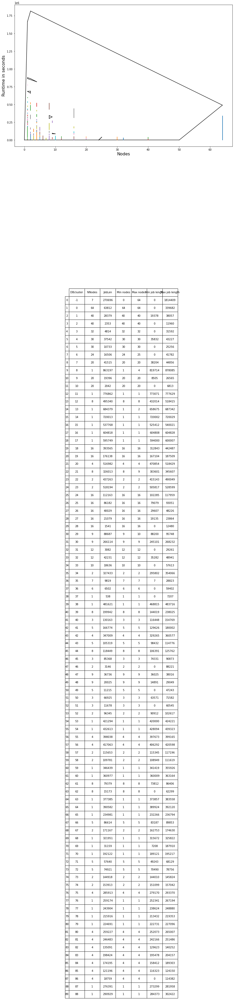

21
(12824, 2)
 48    8217
 41    1145
 42    1076
 34     939
 19     220
-1      218
 17      74
 22      69
 32      68
 7       58
 16      56
 43      40
 40      40
 1       36
 9       34
 18      31
 44      27
 46      26
 3       25
 5       25
 21      25
 15      23
 27      23
 24      21
 23      20
 29      19
 20      17
 39      17
 33      16
 11      15
 8       15
 14      15
 25      14
 13      14
 4       14
 36      13
 12      12
 0       11
 10      11
 35      10
 37      10
 30       9
 6        9
 28       8
 26       8
 31       7
 47       7
 38       6
 45       6
 2        5
Name: DBcluster, dtype: int64
Plotted


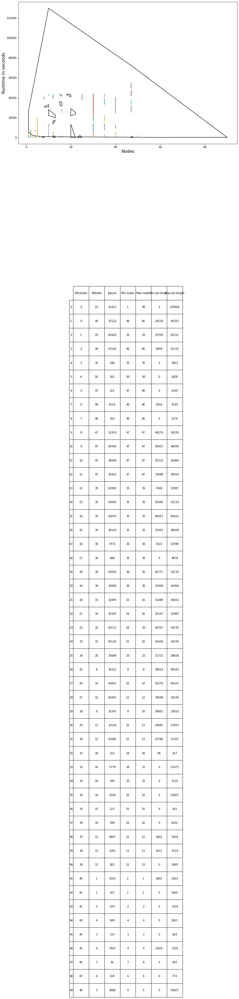

3
(17705, 2)
 17    14182
 10     1663
 11      517
 4       335
 15      316
 12      244
 3       129
 9       110
 8        37
-1        34
 2        34
 18       24
 14       18
 6        17
 5        14
 7         8
 16        6
 1         6
 13        6
 0         5
Name: DBcluster, dtype: int64
Plotted


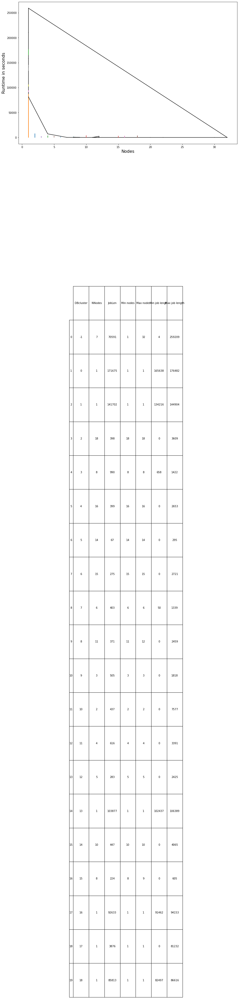

25
(3279, 2)
 20    1355
 27     978
 29     414
 14      83
-1       61
 17      46
 25      43
 16      22
 6       21
 22      20
 12      18
 23      17
 21      16
 11      16
 8       16
 10      14
 15      14
 28      13
 4       12
 24      11
 3       11
 19      10
 5       10
 13       9
 7        8
 26       8
 0        7
 2        7
 18       7
 1        6
 9        6
Name: DBcluster, dtype: int64
Plotted


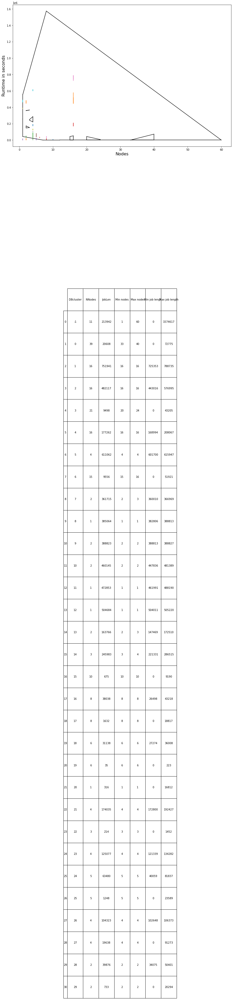

57
(8505, 2)
 9     5262
 8     1987
 6     1002
 5       44
 12      38
 14      26
 7       25
-1       22
 13      21
 0       18
 10      15
 3       12
 2       12
 11       8
 4        7
 1        6
Name: DBcluster, dtype: int64
Plotted


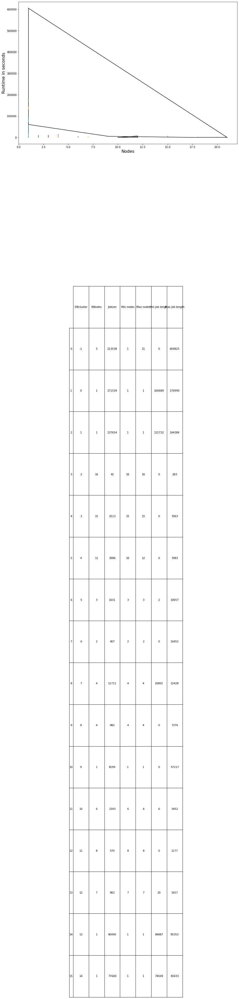

30
(8845, 2)
 13    8150
 7      448
 11      63
 4       33
-1       29
 2       23
 8       15
 10      15
 9       14
 6       12
 12      11
 1       11
 3        9
 0        7
 5        5
Name: DBcluster, dtype: int64
Plotted


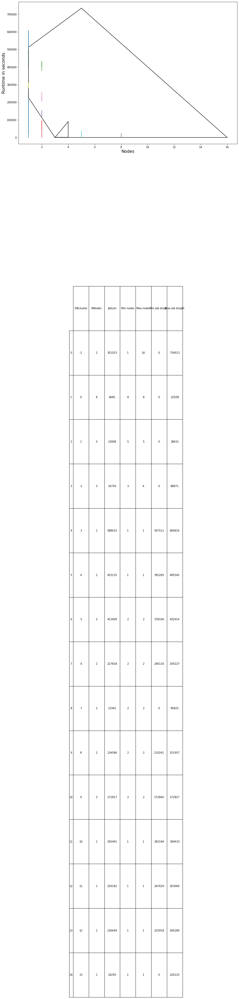

38
(1422, 2)
 5    888
 6    363
 4     79
 7     29
-1     15
 3     15
 0     15
 1     12
 2      6
Name: DBcluster, dtype: int64
Plotted


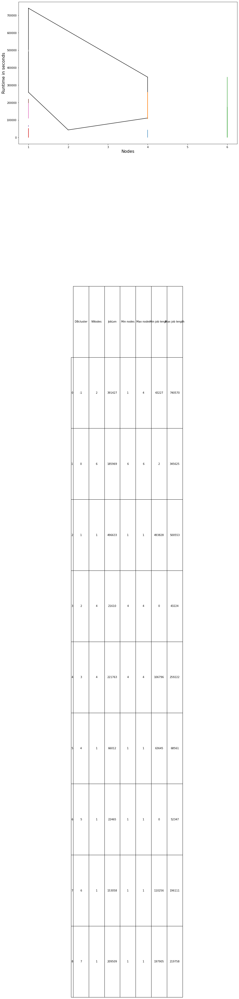

73
(18500, 2)
 4    18271
 3       72
 0       49
 1       45
-1       36
 6       14
 5        7
 2        6
Name: DBcluster, dtype: int64
Plotted


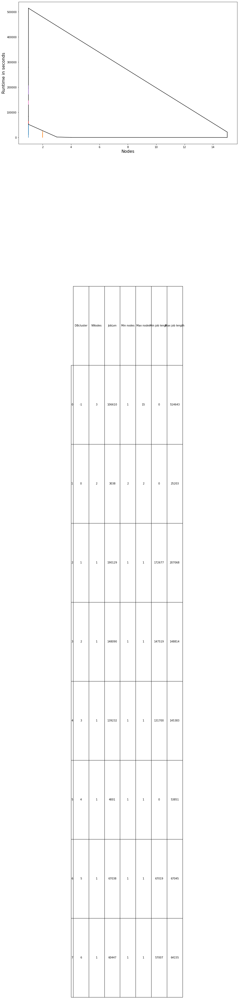

27
(4122, 2)
 37    2261
 28     579
 33     334
 31     161
 35     130
-1      111
 11      76
 15      45
 5       42
 24      42
 39      21
 23      18
 36      18
 34      16
 32      15
 16      15
 26      15
 20      15
 7       14
 2       14
 18      13
 4       12
 0       12
 1       11
 25      11
 12      10
 8       10
 29       9
 38       9
 22       8
 9        8
 10       7
 30       7
 21       7
 17       7
 14       7
 6        7
 27       7
 3        6
 13       6
 19       6
Name: DBcluster, dtype: int64
Plotted


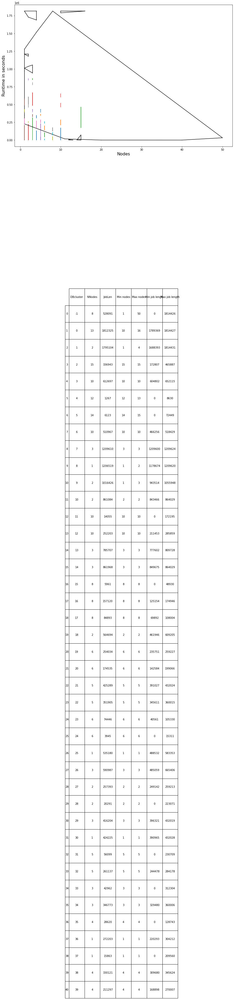

7
(4024, 2)
 12    3460
 7      240
 5       92
 3       67
 6       47
 1       22
-1       20
 9       19
 2       18
 4        9
 11       9
 0        8
 10       7
 8        6
Name: DBcluster, dtype: int64
Plotted


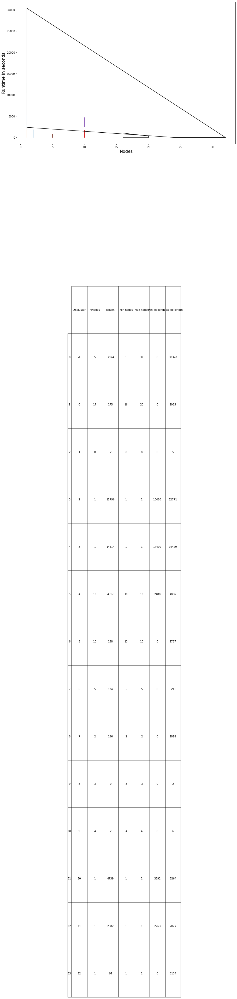

40
(7203, 2)
 5    6855
 2     193
 1      38
 4      26
 7      26
-1      13
 9      13
 8      13
 3      10
 6      10
 0       6
Name: DBcluster, dtype: int64
Plotted


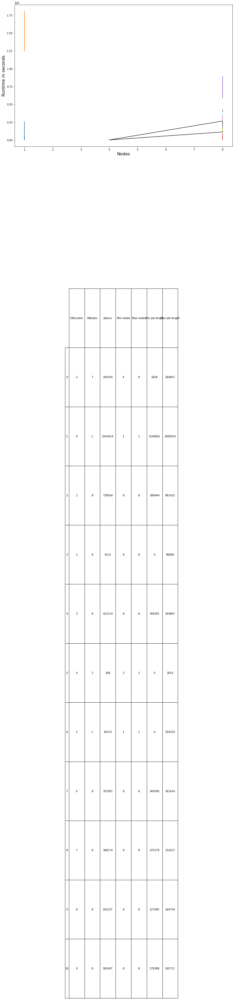

8
(1594, 2)
 5    1486
 2      30
 0      26
 3      22
 4      13
-1       9
 1       8
Name: DBcluster, dtype: int64
Plotted


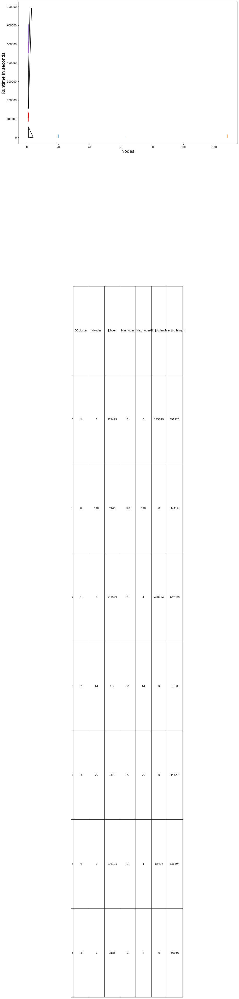

32
(2563, 2)
 13    887
 17    391
 14    283
 15    252
 4     249
 9     245
 1     149
-1      25
 2      13
 7      10
 5       8
 6       8
 11      7
 16      6
 12      6
 10      6
 8       6
 3       6
 0       6
Name: DBcluster, dtype: int64
Plotted


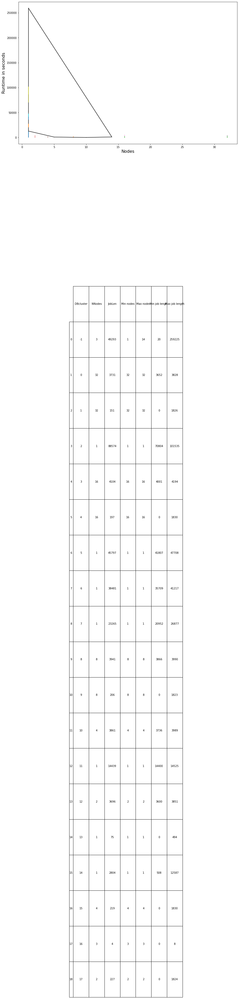

50
(169, 2)
 8    65
 4    24
 1    21
 7    11
 2    11
 5     9
 6     9
-1     7
 3     6
 0     6
Name: DBcluster, dtype: int64
Plotted


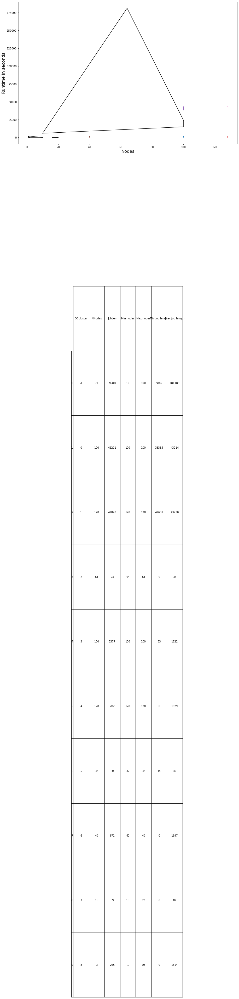

34
(385, 2)
 3    338
 1     21
 2     11
-1      9
 0      6
Name: DBcluster, dtype: int64
Plotted


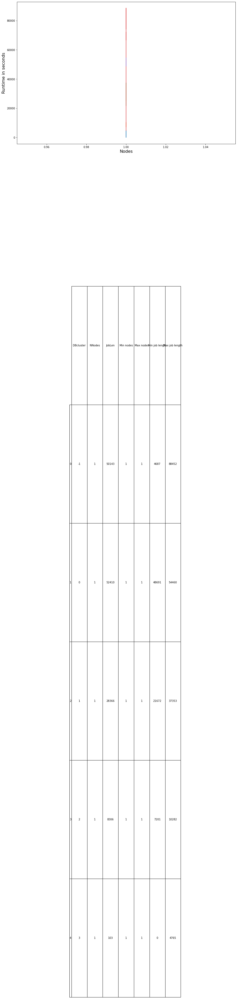

4
(13691, 2)
 11    6642
 14    6591
 5      139
 9       72
 12      56
 8       37
-1       25
 2       23
 3       21
 13      20
 4       16
 0       13
 10      10
 1       10
 7        9
 6        7
Name: DBcluster, dtype: int64
Plotted


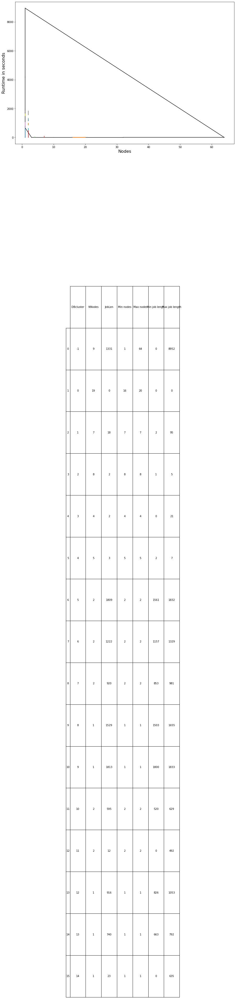

35
(41689, 2)
 8    41445
 5      106
 0       30
 3       27
 2       25
 7       17
 1       14
-1       12
 6        7
 4        6
Name: DBcluster, dtype: int64
Plotted


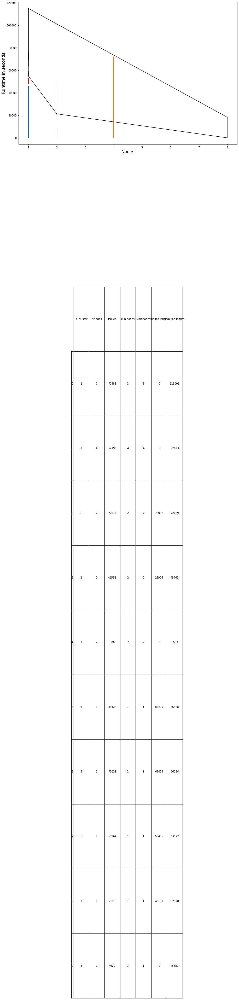

52
(173621, 2)
 8     161641
 10      2846
 5       1216
 4        870
 7        863
 6        740
 3        493
 16       473
 17       448
 12       406
 24       356
 25       353
 15       353
 18       352
 23       352
 26       352
 19       352
 20       352
 21       352
 22       213
 1         77
 11        72
-1         47
 14        11
 13        10
 2          9
 9          6
 0          6
Name: DBcluster, dtype: int64
Plotted


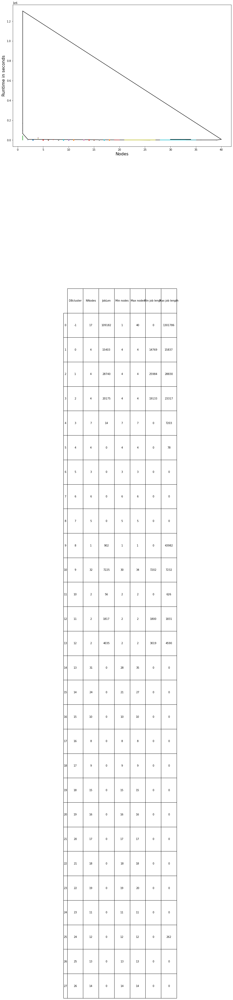

80
(77, 2)
 1    66
 0     6
-1     5
Name: DBcluster, dtype: int64
Plotted


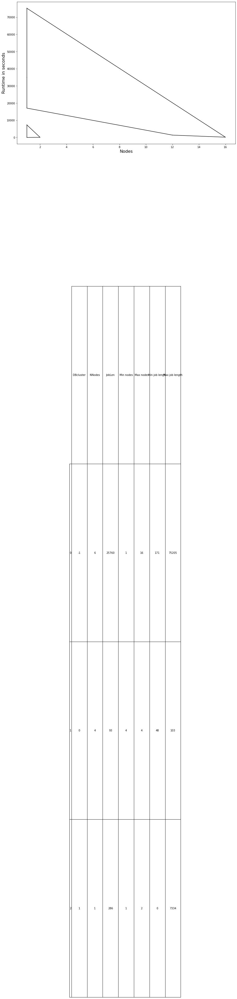

10
(463, 2)
 2    444
 1     10
 0      8
-1      1
Name: DBcluster, dtype: int64
Plotted


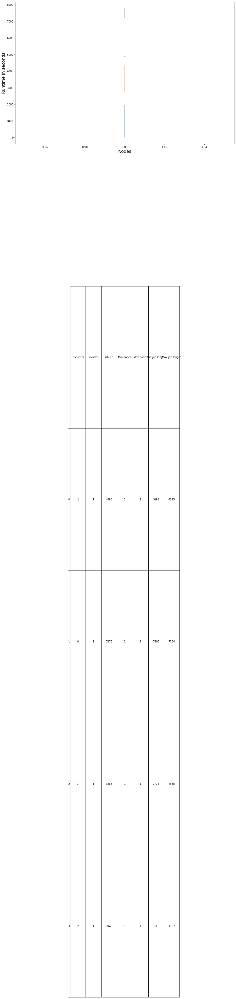

79
(3052, 2)
 1    3032
 0      12
-1       8
Name: DBcluster, dtype: int64
Plotted


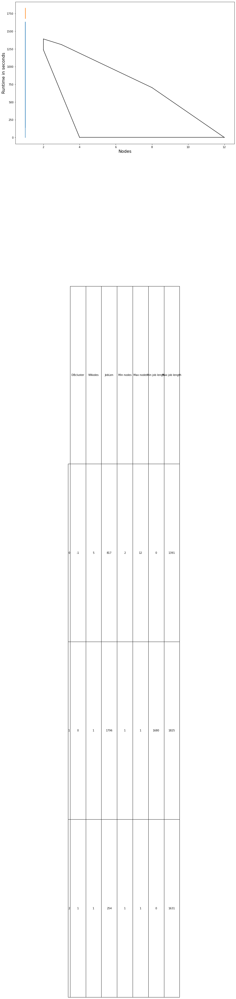

51
(2859, 2)
 12    1105
 3      878
 9      516
 13      69
 8       60
 10      55
 15      30
-1       25
 7       25
 1       18
 2       18
 11      12
 5       12
 4       11
 6       10
 14       8
 0        7
Name: DBcluster, dtype: int64
Plotted


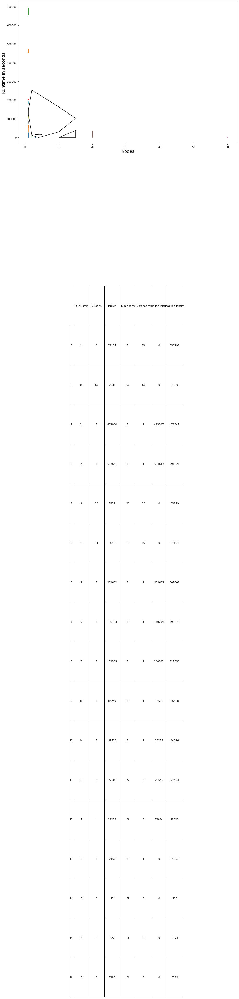

53
(3359, 2)
 3    3331
-1      11
 2       7
 1       5
 0       5
Name: DBcluster, dtype: int64
Plotted


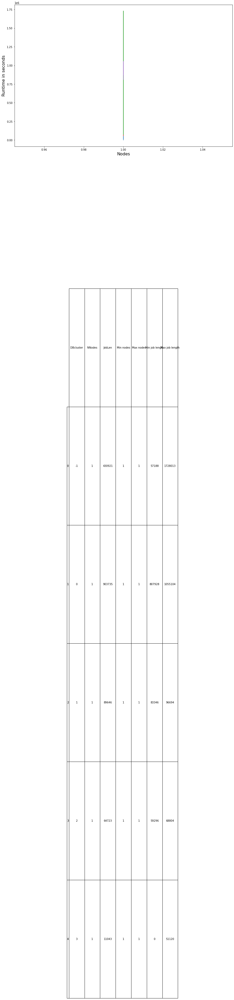

55
(781, 2)
 0    427
 5    294
 6     12
 7     11
 2      9
-1      9
 1      7
 3      6
 4      6
Name: DBcluster, dtype: int64
Plotted


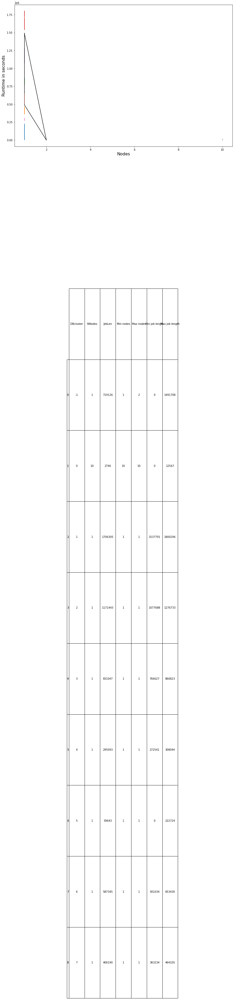

62
(332, 2)
 2    75
 5    55
 7    51
 9    37
-1    28
 0    24
 3    21
 1    18
 4     9
 6     8
 8     6
Name: DBcluster, dtype: int64
Plotted


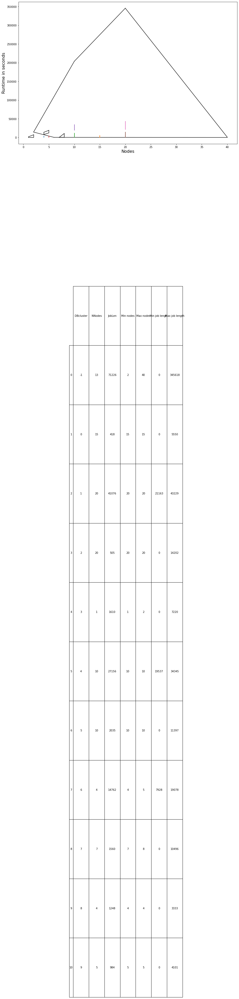

9
(1469, 2)
 0    1284
 2      88
 6      26
-1      24
 4      21
 1      10
 5       9
 3       7
Name: DBcluster, dtype: int64
Plotted


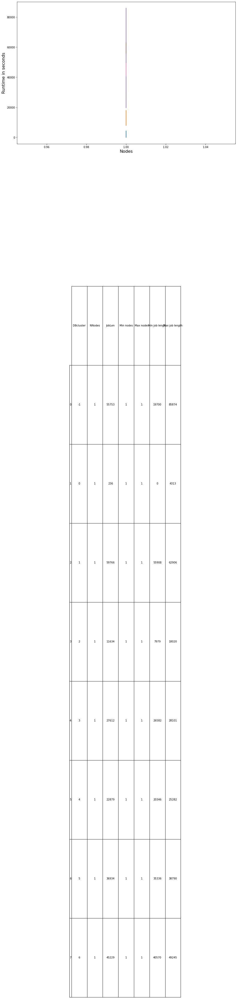

13
(268, 2)
 3    147
 5     42
 2     37
 6     11
 0     11
 4      7
 1      7
-1      6
Name: DBcluster, dtype: int64
Plotted


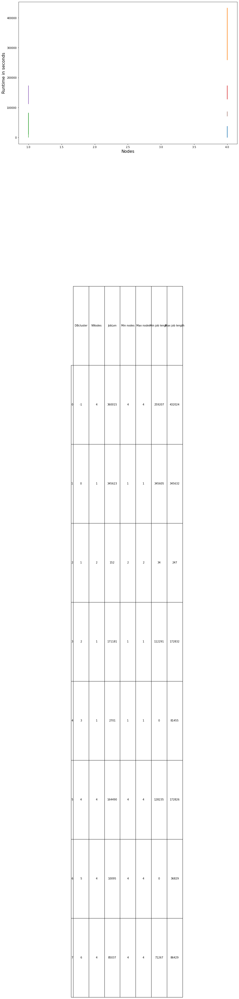

28
(315, 2)
 5    170
 3     70
 2     36
 1     16
 4      9
 0      8
-1      6
Name: DBcluster, dtype: int64
Plotted


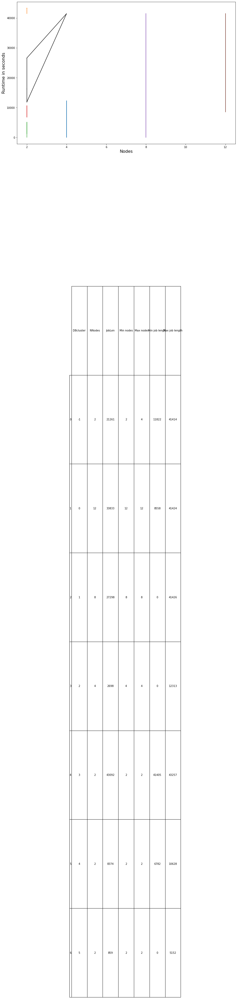

71
(572, 2)
 9     263
 3      66
 7      65
 8      55
-1      33
 5      16
 2      15
 1      13
 11     11
 6      11
 10      9
 0       8
 4       7
Name: DBcluster, dtype: int64
Plotted


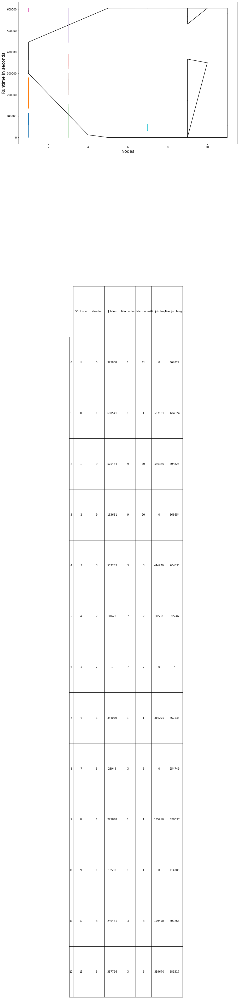

68
(163, 2)
 4    73
 1    24
 0    22
 5    11
 6    10
 2    10
 3     7
-1     6
Name: DBcluster, dtype: int64
Plotted


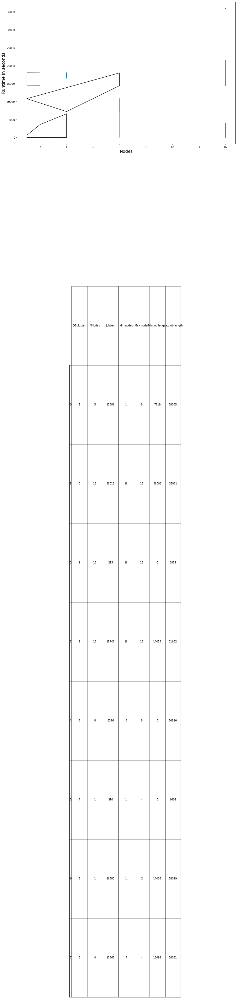

56
(335, 2)
 6    114
 7     64
 8     48
 9     26
 3     19
-1     15
 2     13
 1     11
 4      9
 0      8
 5      8
Name: DBcluster, dtype: int64
Plotted


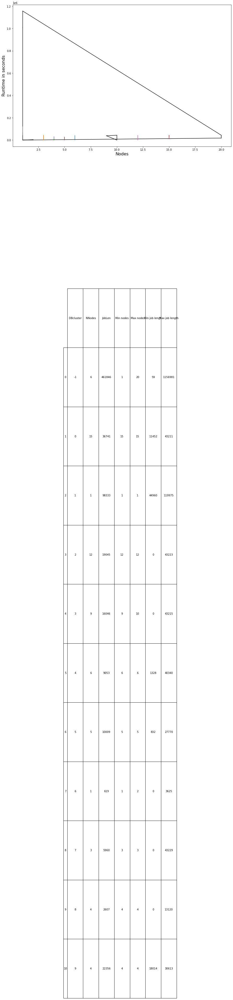

11
(1409, 2)
 0    1353
 3      27
-1      13
 1       8
 2       8
Name: DBcluster, dtype: int64
Plotted


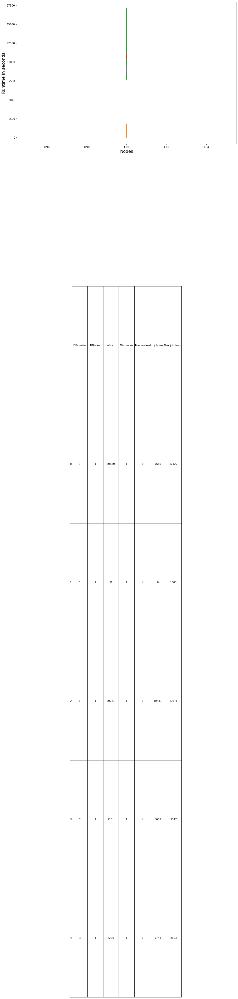

45
(60, 2)
 2    34
 0    12
 1     8
-1     6
Name: DBcluster, dtype: int64
Plotted


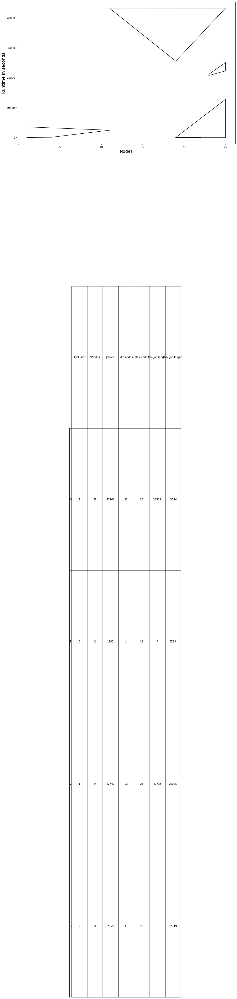

44
(118, 2)
 1    49
 0    23
 5    15
 2    10
 4     9
 3     8
-1     4
Name: DBcluster, dtype: int64
Plotted


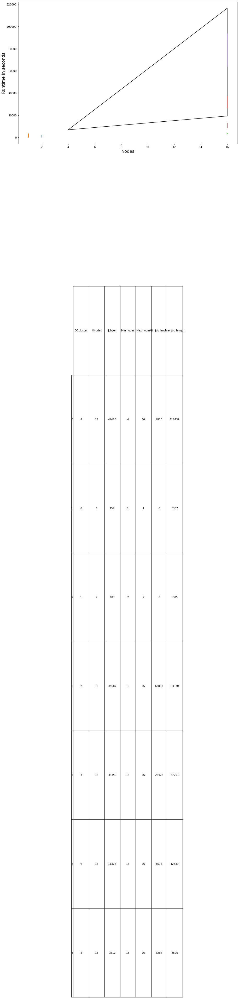

29
(1240, 2)
 10    537
 8     274
 4     162
 6     128
 9      37
-1      29
 2      21
 0      20
 3      11
 1       8
 5       7
 7       6
Name: DBcluster, dtype: int64
Plotted


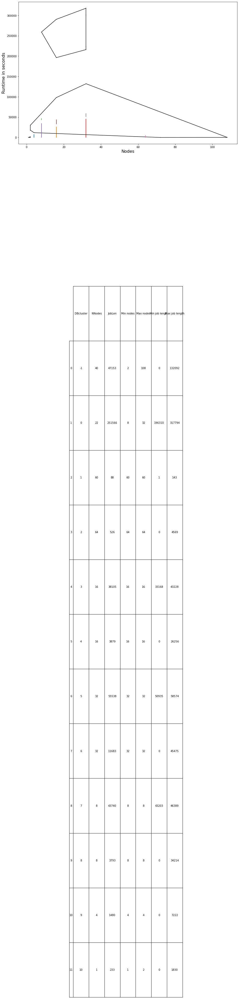

16
(7720, 2)
 1    7672
 2      35
 0       9
-1       4
Name: DBcluster, dtype: int64
Plotted


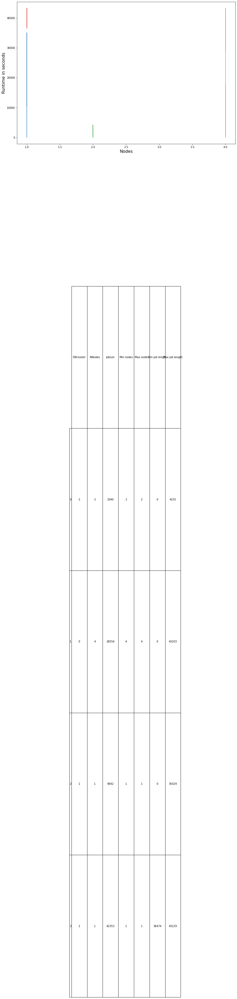

33
(933, 2)
 4    581
 7     95
 5     90
 6     76
 2     33
-1     27
 0     15
 1      9
 3      7
Name: DBcluster, dtype: int64
Plotted


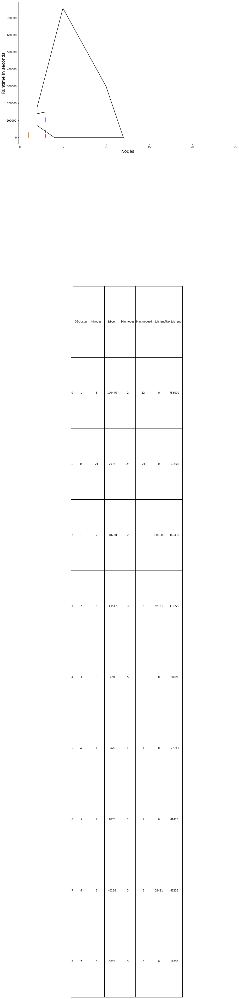

24
(839, 2)
 2    322
 6    307
 8     71
-1     38
 3     35
 1     32
 7     12
 0      9
 5      7
 4      6
Name: DBcluster, dtype: int64
Plotted


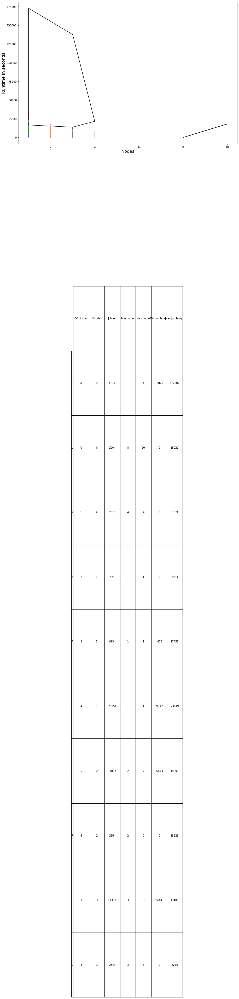

41
(8986, 2)
 10    7789
 15     337
 14     280
 12     179
 13      57
 3       52
-1       47
 0       45
 17      43
 2       34
 9       21
 7       18
 8       17
 16      16
 1       16
 11       9
 6        9
 4        9
 5        8
Name: DBcluster, dtype: int64
Plotted


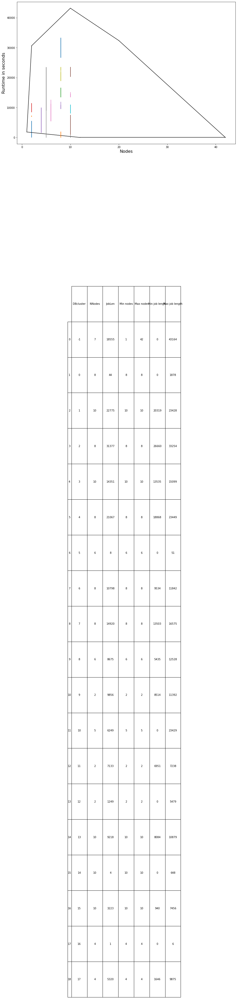

48
(13571, 2)
 3    13463
 2       71
 1       25
 0        7
-1        5
Name: DBcluster, dtype: int64
Plotted


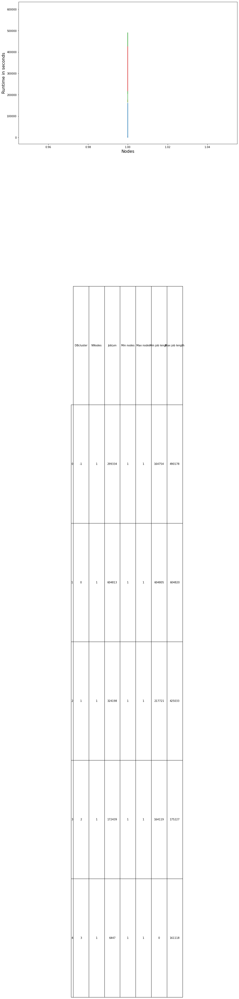

49
(1026, 2)
 4    673
 3    275
 2     34
 1     26
-1     12
 0      6
Name: DBcluster, dtype: int64
Plotted


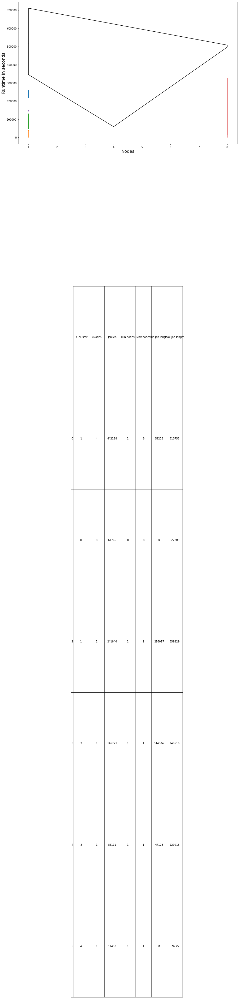

67
(852, 2)
 6    657
 1     54
 4     35
 5     32
 2     28
-1     18
 0     15
 3     13
Name: DBcluster, dtype: int64
Plotted


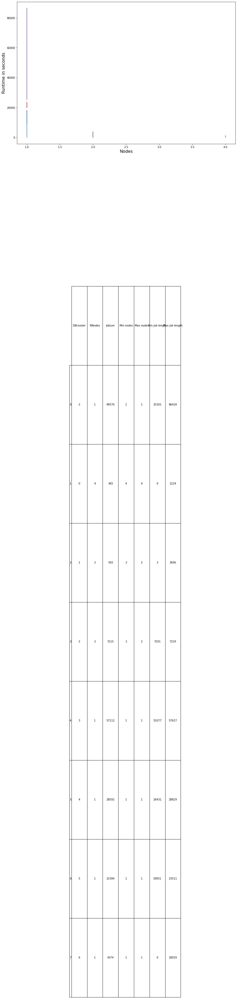

64
(1343, 2)
 5     692
 16    171
 7     105
 12     87
 14     48
 10     45
 4      38
 6      32
-1      27
 15     18
 11     17
 3      13
 13     12
 1      10
 2       8
 0       7
 8       7
 9       6
Name: DBcluster, dtype: int64
Plotted


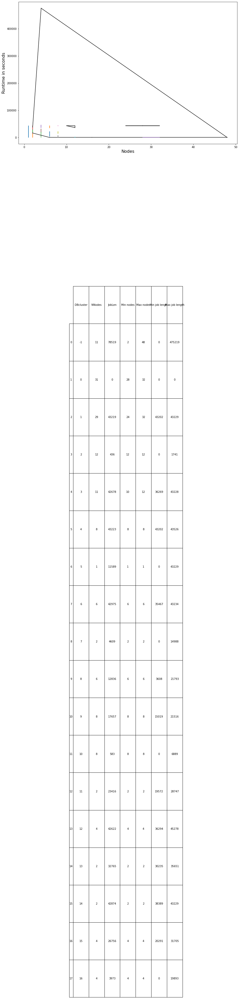

43
(951, 2)
 5    773
 4    101
 1     44
 2     12
-1      8
 3      7
 0      6
Name: DBcluster, dtype: int64
Plotted


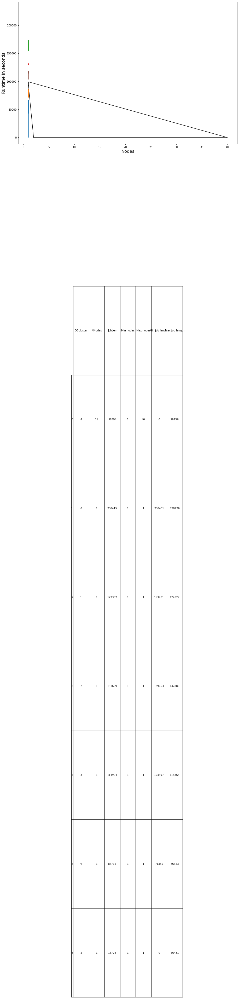

63
(457, 2)
 0    414
 3     15
 4     10
 1      7
 2      7
-1      4
Name: DBcluster, dtype: int64
Plotted


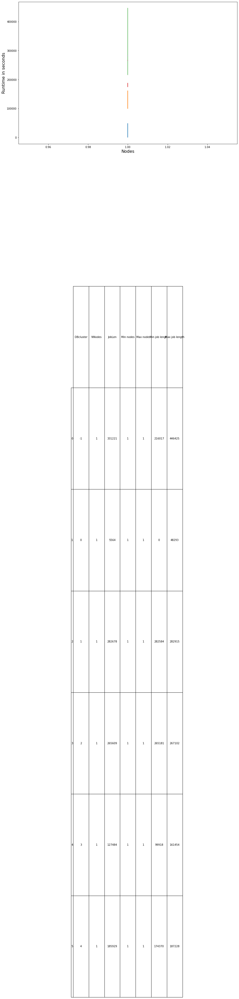

19
(90, 2)
 1    78
-1     6
 0     6
Name: DBcluster, dtype: int64
Plotted


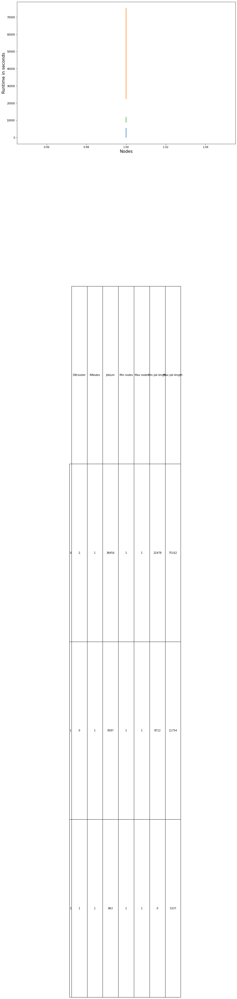

17
(259, 2)
 2    223
 1     16
 0     13
-1      7
Name: DBcluster, dtype: int64
Plotted


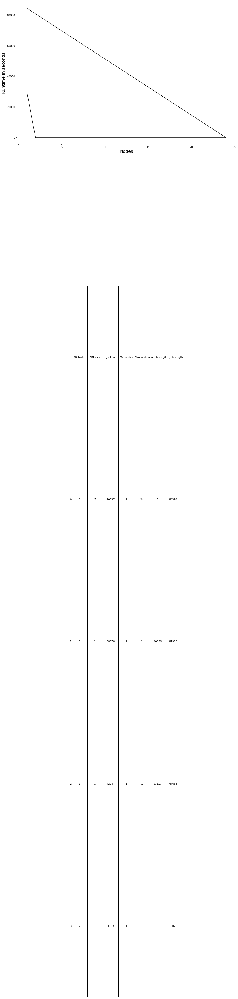

31
(230, 2)
 2    167
 0     40
 1     20
-1      3
Name: DBcluster, dtype: int64
Plotted


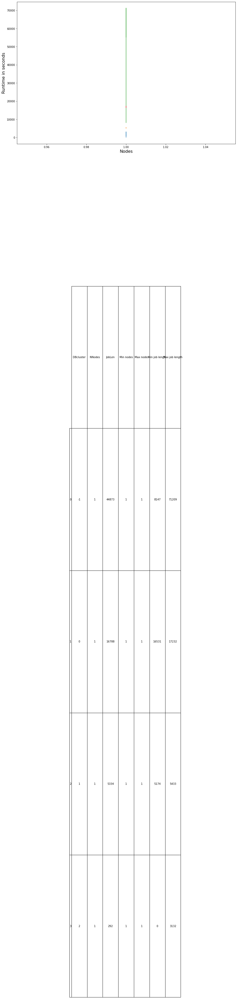

46
(2175, 2)
 3    1793
 0     337
 1      36
 2       8
-1       1
Name: DBcluster, dtype: int64
Plotted


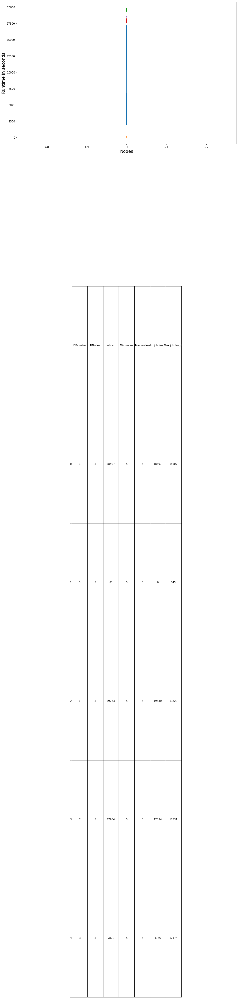

78
(495, 2)
 3    316
 0    114
 1     48
 2     11
-1      6
Name: DBcluster, dtype: int64
Plotted


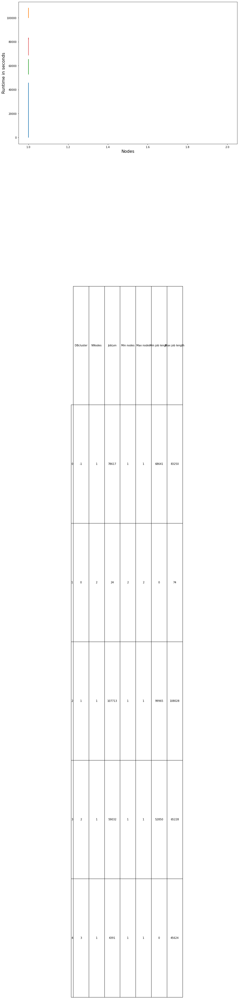

60
(804, 2)
 10    456
 3      71
 12     68
 14     42
 9      36
 5      24
 1      21
-1      16
 13     14
 8      12
 11     10
 4       9
 6       8
 2       6
 0       6
 7       5
Name: DBcluster, dtype: int64
Plotted


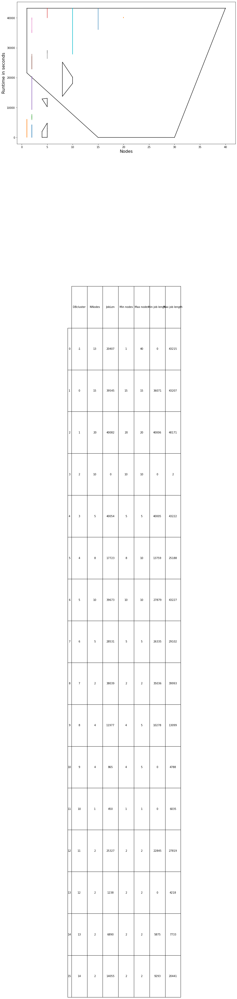

36
(20, 2)
1    14
0     6
Name: DBcluster, dtype: int64
Plotted


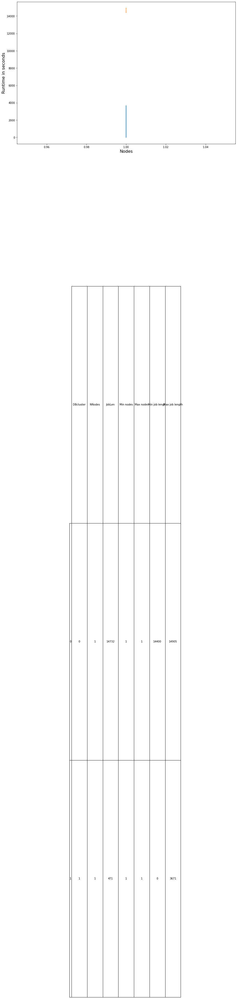

70
(311, 2)
 2    269
-1     15
 0     12
 3      9
 1      6
Name: DBcluster, dtype: int64
Plotted


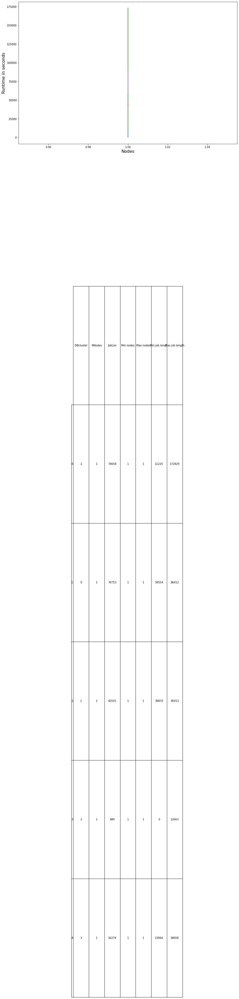

54
(797, 2)
 5     519
 7     123
 10     22
 1      20
-1      17
 0      15
 2      14
 12     13
 11     12
 4      11
 6       9
 8       8
 9       7
 3       7
Name: DBcluster, dtype: int64
Plotted


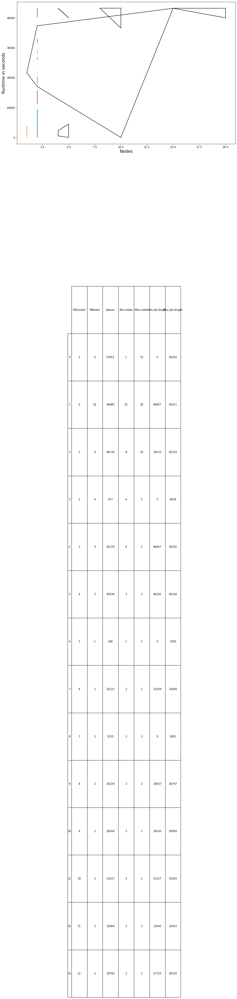

59
(32126, 2)
 2    31731
 3      217
 1      103
-1       27
 4       25
 0       23
Name: DBcluster, dtype: int64
Plotted


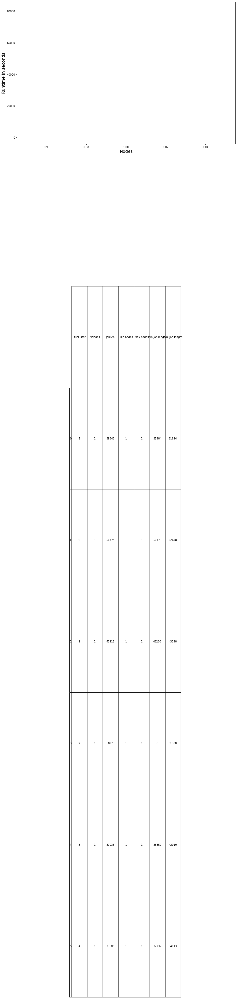

26
(355, 2)
 3    231
 5     45
 4     29
 1     22
 2     16
-1      6
 0      6
Name: DBcluster, dtype: int64
Plotted


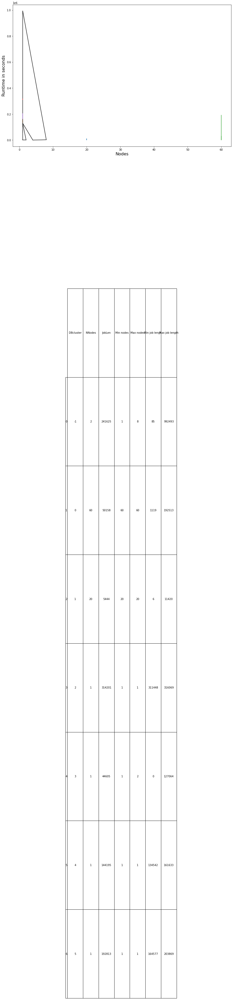

65
(77, 2)
 0    18
 3    15
-1    15
 2    15
 1     8
 4     6
Name: DBcluster, dtype: int64
Plotted


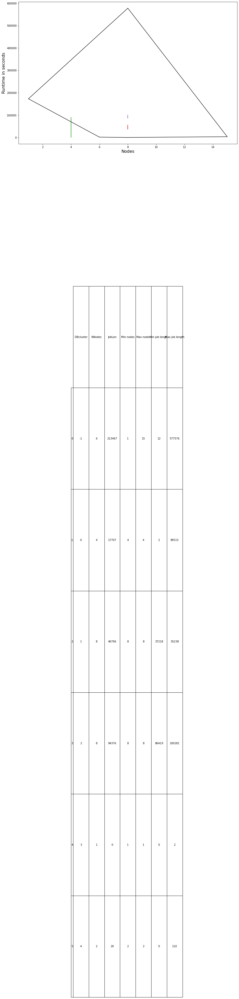

69
(124, 2)
 2    43
-1    25
 4    21
 1    13
 0    11
 3    11
Name: DBcluster, dtype: int64
Plotted


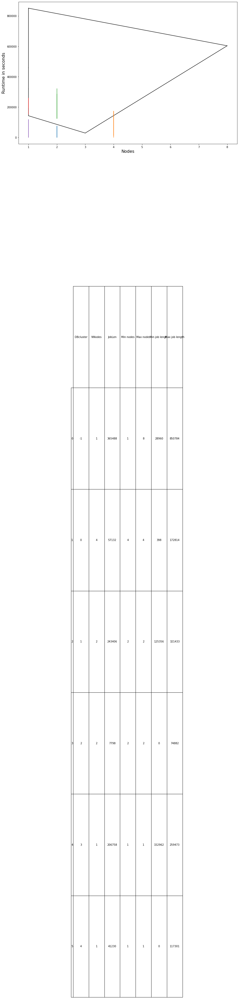

66
(75, 2)
 0    44
 1    25
-1     6
Name: DBcluster, dtype: int64
Plotted


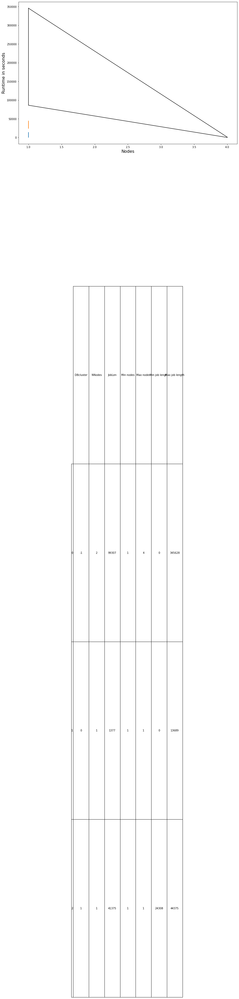

12
(390, 2)
 7    137
 4     88
 2     39
 6     36
 0     35
 5     23
 3     16
-1      9
 1      7
Name: DBcluster, dtype: int64
Plotted


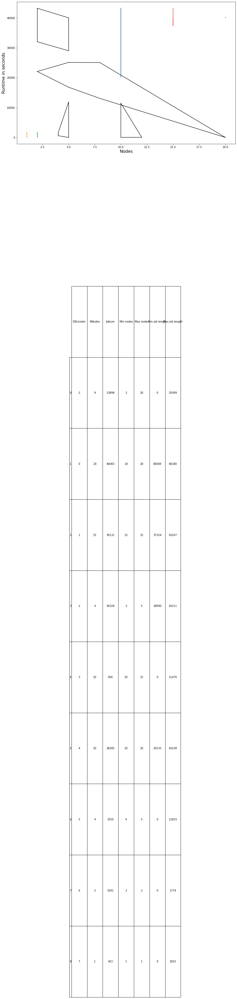

22
(14310, 2)
 7    9164
 0    2241
 9    1721
 3     662
 5     322
 8      69
 2      49
 4      39
 1      20
-1      18
 6       5
Name: DBcluster, dtype: int64
Plotted


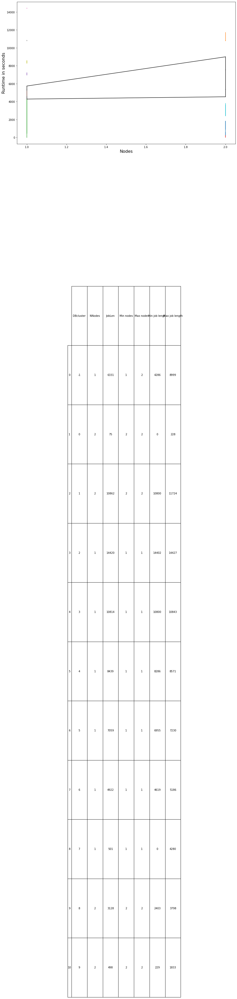

76
(7, 2)
-1    7
Name: DBcluster, dtype: int64
Plotted


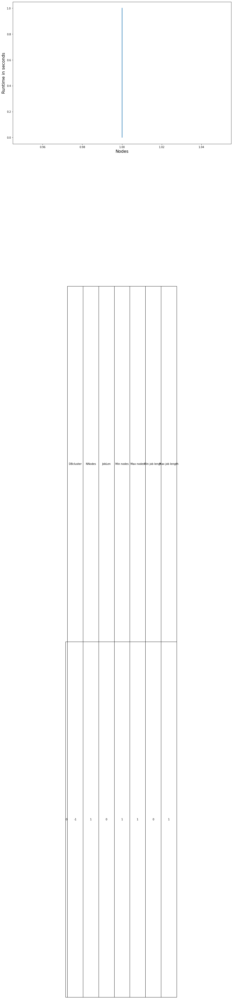

5
(2, 2)
-1    2
Name: DBcluster, dtype: int64
Plotted


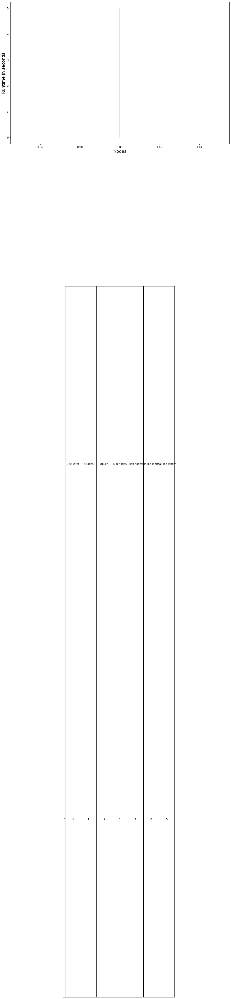

58
(258, 2)
 1    140
 0    110
-1      8
Name: DBcluster, dtype: int64
Plotted


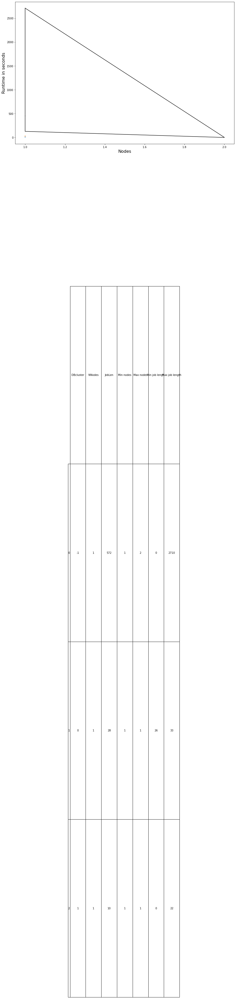

61
(190, 2)
 1    141
 0     17
-1     15
 3      9
 2      8
Name: DBcluster, dtype: int64
Plotted


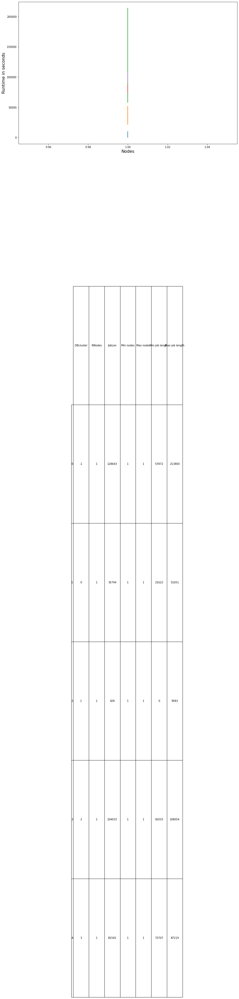

14
(128, 2)
 1    100
 0     27
-1      1
Name: DBcluster, dtype: int64
Plotted


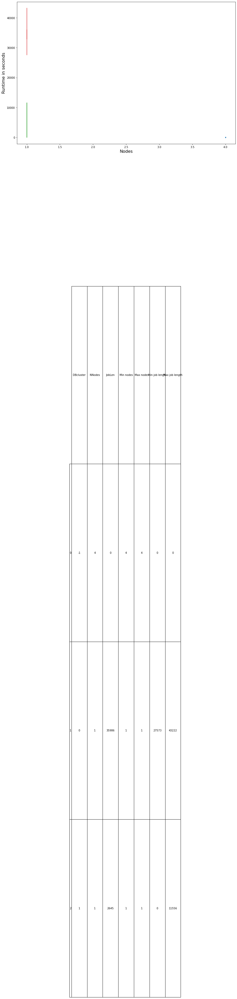

20
(54, 2)
 0    24
-1    22
 1     8
Name: DBcluster, dtype: int64
Plotted


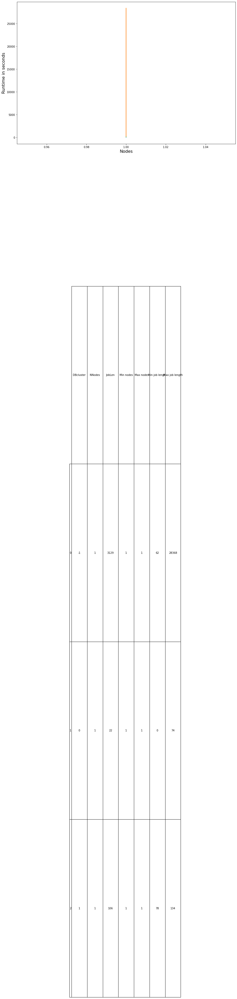

23
(44, 2)
 1    13
 0    11
 2     7
 3     7
-1     6
Name: DBcluster, dtype: int64
Plotted


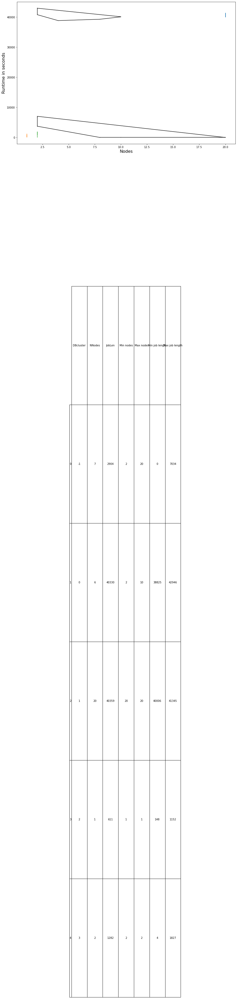

47
(72, 2)
 1    42
 0    15
 2     8
-1     7
Name: DBcluster, dtype: int64
Plotted


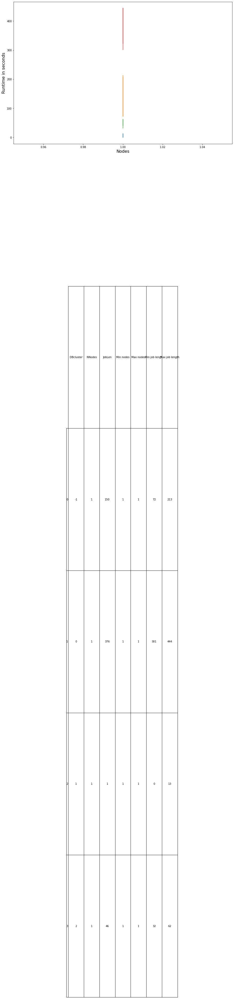

In [41]:
accounts = slurmneg['Account'].unique()
accounts = accounts.tolist()
functionjl(accounts)

## According to partition for individual projects

In [ ]:
AP = slurmnegg[['Account','Partition','NNodes','TimelimitRaw']]

## HDBSCAN for nodes and time limit

In [ ]:
def functionap(accounts,partitions):
    coun = 0
    sil = 0
    best = 0
    for i in accounts:
        print("For account ",i)
        temp = AP.loc[AP.Account == i] 
        if len(temp.index) > 1:
            ClusterData = temp.drop(['Account'], axis=1)
            print(ClusterData.shape)
            for k in partitions:
                print(k)
                temp2 = ClusterData.loc[ClusterData.Partition == k] 
                print(temp2.shape)
                if len(temp2.index) > 1:
                    ClusterData1 = temp2.drop(['Partition'], axis=1)
                    sc_x = StandardScaler()
                    ClusterData2 = sc_x.fit_transform(ClusterData1)    
                    DB = hdbscan.HDBSCAN(min_samples = 5,cluster_selection_epsilon =0.1,min_cluster_size = 5)
                    DB.fit_predict(ClusterData2)
                    temp2['DBcluster'] = pd.Series(DB.labels_, index=temp2.index)
                    a = temp2['DBcluster'].value_counts()
                    print(a)
                    temp2['min_NNodes'] = temp2[['NNodes']]
                    temp2['max_NNodes'] = temp2[['NNodes']]
                    temp2['min_timelimit'] = temp2[['TimelimitRaw']]
                    temp2['max_timelimit'] = temp2[['TimelimitRaw']]
                    temp3 = temp2.groupby('DBcluster', as_index=False).agg({'NNodes':'mean','TimelimitRaw':'mean','min_NNodes':'min','max_NNodes':'max','min_timelimit':'min','max_timelimit':'max'})
                    rcParams['figure.figsize'] = 60, 10
                    palette = sns.color_palette(cc.glasbey, n_colors=len(a))
                    sns.scatterplot(x='NNodes', y='TimelimitRaw', hue='DBcluster',data=temp2,palette=palette).set(title='Clustering for the account {}'.format(i))
                    the_table = plt.table(cellText=temp3.values,
                    rowLabels=temp3.index,
                    colLabels=temp3.columns,
                    cellLoc = 'center', rowLoc = 'center',
                    bbox = ([0.25, -6, 0.5, 5]),loc='bottom')
                    the_table.auto_set_font_size(False)
                    the_table.set_fontsize(10)
                    print("Plotted")
                    if not os.path.exists('HDB_Acc_Part'):
                        os.makedirs('HDB_Acc_Part')
                    plt.savefig('HDB_Acc_Part/{}_{}HDB_Acc_Part.png' .format(i,k),bbox_inches='tight', dpi=100)
                    plt.show()    

In [ ]:
accounts = slurmneg['Account'].unique()
accounts = accounts.tolist()
partitions = slurmneg['Partition'].unique()
partitions = partitions.tolist()
functionap(accounts,partitions)

## HDBSCAN for nodes and job length

In [ ]:
AP2 = slurmnegg[['Account','Partition','NNodes','JobLen']]

In [ ]:
def functionap2(accounts,partitions):
    coun = 0
    sil = 0
    best = 0
    for i in accounts:
        print("For account ",i)
        temp = AP2.loc[AP2.Account == i] 
        if len(temp.index) > 1:
            ClusterData = temp.drop(['Account'], axis=1)
            print(ClusterData.shape)
            for k in partitions:
                print(k)
                temp2 = ClusterData.loc[ClusterData.Partition == k] 
                print(temp2.shape)
                if len(temp2.index) > 1:
                    ClusterData1 = temp2.drop(['Partition'], axis=1)
                    sc_x = StandardScaler()
                    ClusterData2 = sc_x.fit_transform(ClusterData1)    
                    DB = hdbscan.HDBSCAN(min_samples = 5,cluster_selection_epsilon =0.1,min_cluster_size = 5)
                    DB.fit_predict(ClusterData2)
                    temp2['DBcluster'] = pd.Series(DB.labels_, index=temp2.index)
                    a = temp2['DBcluster'].value_counts()
                    print(a)
                    temp2['min_NNodes'] = temp2[['NNodes']]
                    temp2['max_NNodes'] = temp2[['NNodes']]
                    temp2['min_JobLen'] = temp2[['JobLen']]
                    temp2['max_JobLen'] = temp2[['JobLen']]
                    temp3 = temp2.groupby('DBcluster', as_index=False).agg({'NNodes':'mean','JobLen':'mean','min_NNodes':'min','max_NNodes':'max','min_JobLen':'min','max_JobLen':'max'})
                    rcParams['figure.figsize'] = 60, 10
                    palette = sns.color_palette(cc.glasbey, n_colors=len(a))
                    sns.scatterplot(x='NNodes', y='JobLen', hue='DBcluster',data=temp2,palette=palette).set(title='Clustering for the account {}'.format(i))
                    the_table = plt.table(cellText=temp3.values,
                    rowLabels=temp3.index,
                    colLabels=temp3.columns,
                    cellLoc = 'center', rowLoc = 'center',
                    bbox = ([0.25, -6, 0.5, 5]),loc='bottom')
                    the_table.auto_set_font_size(False)
                    the_table.set_fontsize(10)
                    print("Plotted")
                    if not os.path.exists('jl_HDB_Acc_Part'):
                        os.makedirs('jl_HDB_Acc_Part')
                    plt.savefig('jl_HDB_Acc_Part/{}_{}HDB_Acc_Part.png' .format(i,k),bbox_inches='tight', dpi=100)
                    plt.show()    

In [ ]:
accounts = slurmneg['Account'].unique()
accounts = accounts.tolist()
partitions = slurmneg['Partition'].unique()
partitions = partitions.tolist()
functionap2(accounts,partitions)

## Silhoutte Score Analysis

In [ ]:
from random import random
def rand_cluster(n,c,r):
    x,y = c
    points = []
    for i in range(n):
        theta = 2*math.pi*random()
        s = r*random()
        points.append((x+s*math.cos(theta), y+s*math.sin(theta)))
    return points
def rand_clusters(k,n,r,a,b,c,d):
    clusters = []
    for _ in range(k):
        x = a + (b-a)*random()
        y = c + (d-c)*random()
        clusters.extend(rand_cluster(n,(x,y),r))
    return clusters

In [ ]:
clusters = rand_clusters(10,500,0.3,0,2,0,2)

In [ ]:
rcParams['figure.figsize'] = 10, 5
plt.scatter(*zip(*clusters))

In [ ]:
temp = 0
best = 0
from sklearn.metrics import silhouette_score
silhouette_avg = []
K = range(2,15)
for num_clusters in K:
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(clusters)
    cluster_labels = kmeans.labels_
    temp = silhouette_score(clusters, cluster_labels)
    print("silhoutte value for {} is {}".format(num_clusters,temp))
    silhouette_avg.append(temp)
    max_value = max(silhouette_avg)
    best = silhouette_avg.index(max_value) + 2
    print(silhouette_avg)
    print(best)


In [ ]:
clustersd = pd.DataFrame(clusters, columns =['x', 'y'])

In [ ]:
kmeanss3 = KMeans(n_clusters=10)
kmeanss3.fit(clusters)
clustersd['Clustered'] = pd.Series(kmeanss3.labels_, index=clustersd.index)
clustersd['Clustered'].value_counts()

In [ ]:
plt.figure(figsize=(15, 5))

sns.scatterplot(x='x', y='y', hue='Clustered',data=clustersd,palette="bright")

In [ ]:
#Elbow Method to determine the best K value
distortions = []
K = range(2,15)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(clusters)
    distortions.append(kmeanModel.inertia_)
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

## Manual calculation vs scikit silhoutte

In [ ]:
clusters2 = [(1,0.3),(1,0.5),(2,1.2),(1,0.7),(3,1),(3,1.1),(2,1)]

In [ ]:
rcParams['figure.figsize'] = 10, 5
plt.scatter(*zip(*clusters2))

In [ ]:
temp = 0
best = 0
from sklearn.metrics import silhouette_score
silhouette_avg = []
K = range(2,6)
for num_clusters in K:
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(clusters2)
    cluster_labels = kmeans.labels_
    temp = silhouette_score(clusters2, cluster_labels)
    print("silhoutte value for {} is {}".format(num_clusters,temp))
    silhouette_avg.append(temp)
    max_value = max(silhouette_avg)
    best = silhouette_avg.index(max_value) + 2
    print(silhouette_avg)
    print(best)

In [ ]:
kmeanss4 = KMeans(n_clusters=3)
kmeanss4.fit(clusters2)
clusterss['Clustered1'] = pd.Series(kmeanss4.labels_, index=clusterss.index)
clusterss['Clustered1'].value_counts()

In [ ]:
plt.figure(figsize=(15, 5))
sns.scatterplot(x='x', y='y', hue='Clustered1',data=clusterss,palette="bright")
the_table = plt.table(cellText=clusterss.values,
          rowLabels=clusterss.index,
          colLabels=clusterss.columns,
          cellLoc = 'center', rowLoc = 'center',
          bbox = ([0.25, -6, 0.5, 5]),loc='bottom')
the_table.auto_set_font_size(False)
the_table.set_fontsize(10)
plt.show()

In [ ]:
from scipy.spatial.distance import pdist, squareform
from sklearn.metrics import pairwise_distances

In [ ]:
x,y = zip(*clusters2)

In [ ]:
clusterss = pd.DataFrame(clusters2, columns =['x', 'y'])

In [ ]:
clusterss

In [ ]:
clusterss['cluster'] = 1

In [ ]:
for idx, row in clusterss.iterrows():
    if  clusterss.loc[idx,'x'] == 1:
        clusterss.loc[idx,'cluster'] = 1
    elif clusterss.loc[idx,'x'] == 2:
        clusterss.loc[idx,'cluster'] = 2
    else:
         clusterss.loc[idx,'cluster'] = 3

In [ ]:
clusterss

In [ ]:
dist = pdist(clusterss[['x','y']],metric = 'euclidean')
dist_matrix = pd.DataFrame(squareform(dist))
dist_matrix

In [ ]:
sil_dist = {'a':[0.2,0.13,0.2,0.1,0.1,0.05,0.05]}
sil = pd.DataFrame(sil_dist)
sil = pd.concat([clusterss,sil],axis = 1)
sil

In [ ]:
sil['dist1'] = pd.Series([1.28,1.16,1.22,1.07,2.06,2.08,1.12])
sil['dist2'] = pd.Series([2.13,2.07,1,2.02,1,1,1])
sil['b'] = sil.apply(lambda x : np.min([x.dist1,x.dist2]),axis = 1)
sil

In [ ]:
sil['sil'] = sil.apply(lambda x: (x.b - x.a) / np.max([x.a,x.b]),axis = 1)
sil

In [ ]:
cluster_sils = pd.DataFrame(sil.groupby('cluster').sil.agg('mean'))
cluster_sils

In [ ]:
print('sil:',np.round(sil['sil'].mean(),3))